# House Prices advanced 

## 1) Problem statement
https://towardsdatascience.com/all-about-missing-data-handling-b94b8b5d2184 -- go to tomorrow

- Initial:
    - To predict the house prices using the attributes of individual residential properties in Ames, Iowa between 2006 and 2010.
    - Built up context
        - for residential housing sold in Ames, Iowa between 2006 and 2010. 
        - Our current Appraiser (or surveyor) is unable to complete surveying all the houses so has only done a sample of the houses(?????).
        - The aim is to complete the rest of the houses that have been sold in the area. 
- what is success 
    - A high prediction rate for unseen housing data in Ames, Iowa between 2006 and 2010 
- context for Iowa, Ames 
    - 30 miles north of Des Moines (capital of Iowa) 

To include:
- what are the requirements (find out everything possible at the start and throughout)
- Define the business case 
- What is the success criteria for the project 
- What is my KPI for the project 
- who model for 
- how they want to use it 
- what is needed from me 
- questions about data (is it there before project start, is it clean, do i have access 
- explain in a simple way
- security functions and protocols 

- where:
    - The housing data for individual residential properties in Ames, Iowa from 2006 to 2010
- what:
    - 23 nominal
    - 23 Ordinal
    - 14 discrete
    - 20 continuous 
    - outliers 
        - there is a mention about 5 TRUE outliers to possibly remove 

## 2) Collect the data

This will be done by using a csv file 

notes:

### Importing relevant libraries 

In [1]:
# directory 
import os 
#libraries for collecting data
import pandas as pd 
pd.set_option('display.max_columns', 80) #sets the amount of columns to be viewed (got 80 from df.shape)

import numpy as np 

# Statistics library
from scipy.stats import norm, skew, skewtest
from scipy import stats
#import scipy

# Data preprocessing
import datetime
import re
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Visualization
from matplotlib import pyplot as plt
plt.style.use('fivethirtyeight')
%matplotlib inline
import seaborn as sns

# For modelling
#import sklearn
import xgboost

### Read The Data and Examining

In [2]:
train_orig = pd.read_csv('train.csv')
test_orig = pd.read_csv('test.csv')
print(train_orig)
print('**' *50)
print(test_orig)

        Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0        1          60       RL         65.0     8450   Pave   NaN      Reg   
1        2          20       RL         80.0     9600   Pave   NaN      Reg   
2        3          60       RL         68.0    11250   Pave   NaN      IR1   
3        4          70       RL         60.0     9550   Pave   NaN      IR1   
4        5          60       RL         84.0    14260   Pave   NaN      IR1   
...    ...         ...      ...          ...      ...    ...   ...      ...   
1455  1456          60       RL         62.0     7917   Pave   NaN      Reg   
1456  1457          20       RL         85.0    13175   Pave   NaN      Reg   
1457  1458          70       RL         66.0     9042   Pave   NaN      Reg   
1458  1459          20       RL         68.0     9717   Pave   NaN      Reg   
1459  1460          20       RL         75.0     9937   Pave   NaN      Reg   

     LandContour Utilities LotConfig LandSlope Neig

In [4]:
train_orig.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [5]:
train_orig.nunique(axis=0)

Id               1460
MSSubClass         15
MSZoning            5
LotFrontage       110
LotArea          1073
                 ... 
MoSold             12
YrSold              5
SaleType            9
SaleCondition       6
SalePrice         663
Length: 81, dtype: int64

In [6]:
train_orig.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [7]:
for c in train_orig.columns:
    print("The unique values for {} are {}".format(c,train_orig[c].unique()))

The unique values for Id are [   1    2    3 ... 1458 1459 1460]
The unique values for MSSubClass are [ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40]
The unique values for MSZoning are ['RL' 'RM' 'C (all)' 'FV' 'RH']
The unique values for LotFrontage are [ 65.  80.  68.  60.  84.  85.  75.  nan  51.  50.  70.  91.  72.  66.
 101.  57.  44. 110.  98.  47. 108. 112.  74. 115.  61.  48.  33.  52.
 100.  24.  89.  63.  76.  81.  95.  69.  21.  32.  78. 121. 122.  40.
 105.  73.  77.  64.  94.  34.  90.  55.  88.  82.  71. 120. 107.  92.
 134.  62.  86. 141.  97.  54.  41.  79. 174.  99.  67.  83.  43. 103.
  93.  30. 129. 140.  35.  37. 118.  87. 116. 150. 111.  49.  96.  59.
  36.  56. 102.  58.  38. 109. 130.  53. 137.  45. 106. 104.  42.  39.
 144. 114. 128. 149. 313. 168. 182. 138. 160. 152. 124. 153.  46.]
The unique values for LotArea are [ 8450  9600 11250 ... 17217 13175  9717]
The unique values for Street are ['Pave' 'Grvl']
The unique values for Alley are [nan 'Grvl

#### Aim:
- to understand the data
    - SalePrice - the property's sale price in dollars. This is the target variable that you're trying to predict.
    - MSSubClass: The building class
    - MSZoning: The general zoning classification
    - LotFrontage: Linear feet of street connected to property
    - LotArea: Lot size in square feet
    - Street: Type of road access
    - Alley: Type of alley access
    - LotShape: General shape of property
    - LandContour: Flatness of the property
    - Utilities: Type of utilities available
    - LotConfig: Lot configuration
    - LandSlope: Slope of property
    - Neighborhood: Physical locations within Ames city limits
    - Condition1: Proximity to main road or railroad
    - Condition2: Proximity to main road or railroad (if a second is present)
    - BldgType: Type of dwelling
    - HouseStyle: Style of dwelling
    - OverallQual: Overall material and finish quality
    - OverallCond: Overall condition rating
    - YearBuilt: Original construction date
    - YearRemodAdd: Remodel date
    - RoofStyle: Type of roof
    - RoofMatl: Roof material
    - Exterior1st: Exterior covering on house
    - Exterior2nd: Exterior covering on house (if more than one material)
    - MasVnrType: Masonry veneer type
    - MasVnrArea: Masonry veneer area in square feet
    - ExterQual: Exterior material quality
    - ExterCond: Present condition of the material on the exterior
    - Foundation: Type of foundation
    - BsmtQual: Height of the basement
    - BsmtCond: General condition of the basement
    - BsmtExposure: Walkout or garden level basement walls
    - BsmtFinType1: Quality of basement finished area
    - BsmtFinSF1: Type 1 finished square feet
    - BsmtFinType2: Quality of second finished area (if present)
    - BsmtFinSF2: Type 2 finished square feet
    - BsmtUnfSF: Unfinished square feet of basement area
    - TotalBsmtSF: Total square feet of basement area
    - Heating: Type of heating
    - HeatingQC: Heating quality and condition
    - CentralAir: Central air conditioning
    - Electrical: Electrical system
    - 1stFlrSF: First Floor square feet
    - 2ndFlrSF: Second floor square feet
    - LowQualFinSF: Low quality finished square feet (all floors)
    - GrLivArea: Above grade (ground) living area square feet
    - BsmtFullBath: Basement full bathrooms
    - BsmtHalfBath: Basement half bathrooms
    - FullBath: Full bathrooms above grade
    - HalfBath: Half baths above grade
    - Bedroom: Number of bedrooms above basement level
    - Kitchen: Number of kitchens
    - KitchenQual: Kitchen quality
    - TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)
    - Functional: Home functionality rating
    - Fireplaces: Number of fireplaces
    - FireplaceQu: Fireplace quality
    - GarageType: Garage location
    - GarageYrBlt: Year garage was built
    - GarageFinish: Interior finish of the garage
    - GarageCars: Size of garage in car capacity
    - GarageArea: Size of garage in square feet
    - GarageQual: Garage quality
    - GarageCond: Garage condition
    - PavedDrive: Paved driveway
    - WoodDeckSF: Wood deck area in square feet
    - OpenPorchSF: Open porch area in square feet
    - EnclosedPorch: Enclosed porch area in square feet
    - 3SsnPorch: Three season porch area in square feet
    - ScreenPorch: Screen porch area in square feet
    - PoolArea: Pool area in square feet
    - PoolQC: Pool quality
    - Fence: Fence quality
    - MiscFeature: Miscellaneous feature not covered in other categories
    - MiscVal: $Value of miscellaneous feature
    - MoSold: Month Sold
    - YrSold: Year Sold
    - SaleType: Type of sale
    - SaleCondition: Condition of sale

## 3) Data Processing 

- What 
    - cleaning 
    - integration
    - transformation
        - skewed data
    - reduction

In [8]:
#dropping the id columns as it doesn't add to our model 

#checking the shape of the data before
print("The shape of the training data before is {}".format(train_orig.shape))
print("The shape of the testing  data before is {}".format(test_orig.shape))
train_Id= train_orig['Id']
test_Id = test_orig['Id']
train = train_orig.drop(['Id'],axis=1)
test = test_orig.drop(['Id'], axis=1)
# checking the shape of the data after
print("The shape of the training data before is {}".format(train.shape))
print("The shape of the testing  data before is {}".format(test.shape))
print("The shape of the training set IDs before is {}".format(train_Id.shape))
print("The shape of the testing set IDs data before is {}".format(test_Id.shape))

The shape of the training data before is (1460, 81)
The shape of the testing  data before is (1459, 80)
The shape of the training data before is (1460, 80)
The shape of the testing  data before is (1459, 79)
The shape of the training set IDs before is (1460,)
The shape of the testing set IDs data before is (1459,)


### Outliers -- Value changing 

In [ ]:
#mentioned in the accompanying document (http://jse.amstat.org/v19n3/decock.pdf) that it is recommended to remove some of the
#outliers from GrLivArea feature

(1460, 80)


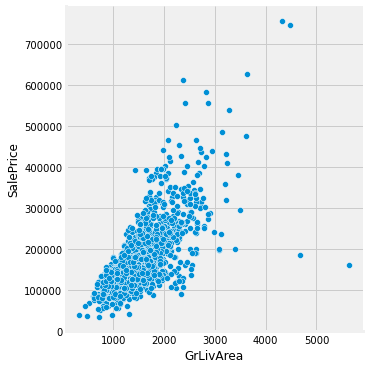

In [9]:
# Before 
sns.relplot(x='GrLivArea', y='SalePrice', data=train)
print(train.shape)

It is evident that the residential areas above 4000 are outliers so I have removed them from the data
- should explain a bit about outliers and the effect it can have and why i removed the entities with the values (unexpected low sale price for a small amount == True outlier; the very high valued houses... An possible solutions to outliers 

(1456, 80)


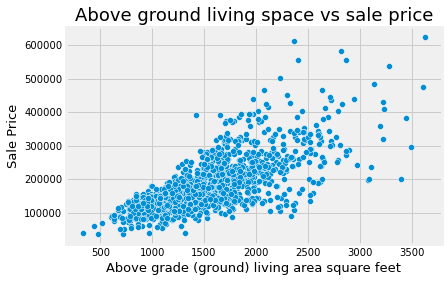

In [10]:
#After
train.drop(train[train['GrLivArea']>4000].index, inplace=True)
plt.title("Above ground living space vs sale price", fontsize=18)
plt.xlabel("Above grade (ground) living area square feet", fontsize=13)
plt.ylabel("Sale Price", fontsize=13)
sns.scatterplot(x='GrLivArea', y='SalePrice', data=train)
print(train.shape)
#Successfully removed the rows of intent

### Target Variable (transformation so normally distributed)

In [ ]:
# Why is this important 

<AxesSubplot:title={'center':'Initial state of Sales Price'}, xlabel='Above grade (ground) living area square feet', ylabel='Frequency'>

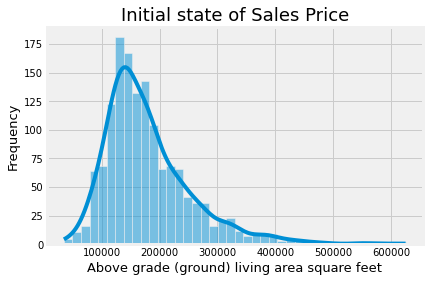

In [11]:
# visualising the initial state of the target variable
plt.title("Initial state of Sales Price", fontsize=18)
plt.xlabel("Above grade (ground) living area square feet", fontsize=13)
plt.ylabel("Frequency", fontsize=13)
sns.histplot(train['SalePrice'],kde=True)

In [36]:
print("The initial skew value is {}".format(skew(train['SalePrice'])))
print("The test to see if it is statistically significant to class it is normally distributed {}".format(skewtest(train['SalePrice']))) 

The initial skew value is 1.564345548419458
The test to see if it is statistically significant to class it is normally distributed SkewtestResult(statistic=18.017292095596787, pvalue=1.4255233619425618e-72)


The chart shows that the target variable is right-skewed (more datapoints above the mean than less than). The ideal state is to be normally distributed (both tails are symmetrical). 

The Skew value should return 0 when the data is normally distributed 

What is the difficulty of skewed data? It becomes difficult 

<AxesSubplot:xlabel='SalePrice', ylabel='Count'>

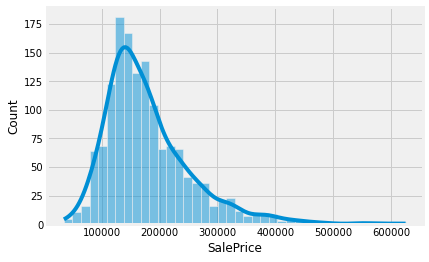

In [12]:
sns.histplot(train['SalePrice'],kde=True)

In [13]:
# not done yet! Will do for data transformation 
train['SalePrice'] = np.log1p(train['SalePrice'])

This will transform the values by using log(x+1)

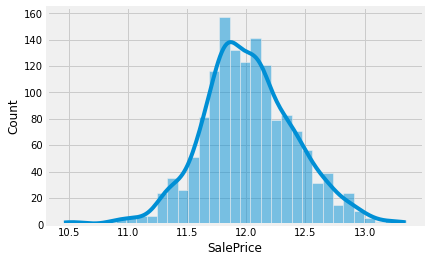

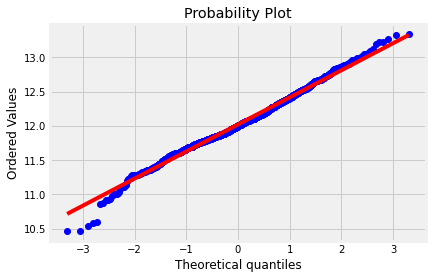

In [14]:
sns.histplot(train['SalePrice'],kde=True)
#QQ-plot
fig = plt.figure()
res = stats.probplot(train['SalePrice'], plot=plt)
plt.show() 

In [39]:
print("The new skew value is {}".format(skew(train['SalePrice'])))
print("The test to see if it is statistically significant to class it is normally distributed {}".format(skewtest(train['SalePrice']))) 

The new skew value is 0.06539261154401081
The test to see if it is statistically significant to class it is normally distributed SkewtestResult(statistic=1.0227791820400707, pvalue=0.30641226315394765)


C:\Users\james\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='SalePrice'>

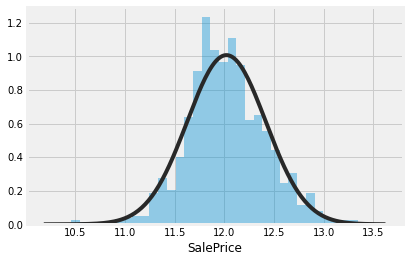

In [49]:
sns.distplot(train['SalePrice'],kde=False, fit=norm)

In [9]:
train_num = train.shape[0]
train_num

1460

### Other Value Changes

#### Correcting values (intially looking at the missing data)

##### Some of the missing values are presented as missing rather than as 'none'

The values are as follows:
- Alley will go with none
- 'BsmtQual' (basement) states that NA = NONE
- 'BsmtCond' = NA = no basement  
- 'BsmtExposure' ()
- 'BsmtFinType1', = NA = no basement 
- 'BsmtFinType2', = NA = no basement 
    - there is a difference in missing data for the above two
    - i checked df[(df['BsmtFinType2']=='None')] -> i dont know why
- 'FireplaceQu', = NA = no fireplace 
- 'GarageType',= NA = no garage 
- 'GarageFinish', = NA = no garage
- 'GarageQual', = Na = no garage 
- 'GarageCond', = Na = no garage 
- 'PoolQC', = NA = no pool;
- 'Fence', = NA = no fence
- 'MiscFeature'=NA = no fence

#### Before

In [10]:
# I have decided to keep the groups separated for the time being 
for i in train.columns:
    if train[str(i)].isna().sum() > 0:
        print("column {} has {} missing values".format(i,train[str(i)].isna().sum()))

column LotFrontage has 259 missing values
column Alley has 1369 missing values
column MasVnrType has 8 missing values
column MasVnrArea has 8 missing values
column BsmtQual has 37 missing values
column BsmtCond has 37 missing values
column BsmtExposure has 38 missing values
column BsmtFinType1 has 37 missing values
column BsmtFinType2 has 38 missing values
column Electrical has 1 missing values
column FireplaceQu has 690 missing values
column GarageType has 81 missing values
column GarageYrBlt has 81 missing values
column GarageFinish has 81 missing values
column GarageQual has 81 missing values
column GarageCond has 81 missing values
column PoolQC has 1453 missing values
column Fence has 1179 missing values
column MiscFeature has 1406 missing values


In [11]:
for i in test.columns:
    if test[str(i)].isna().sum() > 0:
        print("column {} has {} missing values".format(i,test[str(i)].isna().sum()))

column MSZoning has 4 missing values
column LotFrontage has 227 missing values
column Alley has 1352 missing values
column Utilities has 2 missing values
column Exterior1st has 1 missing values
column Exterior2nd has 1 missing values
column MasVnrType has 16 missing values
column MasVnrArea has 15 missing values
column BsmtQual has 44 missing values
column BsmtCond has 45 missing values
column BsmtExposure has 44 missing values
column BsmtFinType1 has 42 missing values
column BsmtFinSF1 has 1 missing values
column BsmtFinType2 has 42 missing values
column BsmtFinSF2 has 1 missing values
column BsmtUnfSF has 1 missing values
column TotalBsmtSF has 1 missing values
column BsmtFullBath has 2 missing values
column BsmtHalfBath has 2 missing values
column KitchenQual has 1 missing values
column Functional has 2 missing values
column FireplaceQu has 730 missing values
column GarageType has 76 missing values
column GarageYrBlt has 78 missing values
column GarageFinish has 78 missing values
co

#### Process

In [9]:
list_of_missing_data = ['Alley',
            'BsmtQual',
            'BsmtCond',
            'BsmtExposure',
            'BsmtFinType1',
            'BsmtFinType2',
            'FireplaceQu',
            'GarageType',
            'GarageFinish',
            'GarageQual',
            'GarageCond',
            'PoolQC',
            'Fence',
            'MiscFeature']
for i in train[list_of_missing_data]:
    train[str(i)] = train[str(i)].fillna('None')
for i in test[list_of_missing_data]:
    test[str(i)] = test[str(i)].fillna('None')

In [10]:
for i in train.columns:
    if train[str(i)].isna().sum() > 0:
        print("column {} has {} missing values".format(i,train[str(i)].isna().sum()))
print("***")
for i in test.columns:
    if test[str(i)].isna().sum() > 0:
        print("column {} has {} missing values".format(i,test[str(i)].isna().sum()))

column LotFrontage has 259 missing values
column MasVnrType has 8 missing values
column MasVnrArea has 8 missing values
column Electrical has 1 missing values
column GarageYrBlt has 81 missing values
***
column MSZoning has 4 missing values
column LotFrontage has 227 missing values
column Utilities has 2 missing values
column Exterior1st has 1 missing values
column Exterior2nd has 1 missing values
column MasVnrType has 16 missing values
column MasVnrArea has 15 missing values
column BsmtFinSF1 has 1 missing values
column BsmtFinSF2 has 1 missing values
column BsmtUnfSF has 1 missing values
column TotalBsmtSF has 1 missing values
column BsmtFullBath has 2 missing values
column BsmtHalfBath has 2 missing values
column KitchenQual has 1 missing values
column Functional has 2 missing values
column GarageYrBlt has 78 missing values
column GarageCars has 1 missing values
column GarageArea has 1 missing values
column SaleType has 1 missing values


Can see that most of the missing data is in the testing set

In [ ]:
# other

In [15]:
# Function to calculate missing values by column (not my code)
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = (100 * df.isnull().sum()) / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [16]:
missing_values_table(train)

Your selected dataframe has 80 columns.
There are 19 columns that have missing values.


,Missing Values,% of Total Values
PoolQC,1451,99.7
MiscFeature,1402,96.3
Alley,1365,93.8
Fence,1176,80.8
FireplaceQu,690,47.4
LotFrontage,259,17.8
GarageType,81,5.6
GarageYrBlt,81,5.6
GarageFinish,81,5.6
GarageQual,81,5.6


##### changing the ordinal feature to a string as not to confuse 

In [12]:
#MSSubClass is the only feature that is categorical but presented as numerical 
train['MSSubClass'] = train['MSSubClass'].apply(str)

### Feature Engineering 

In [ ]:
# NEW LEARNED:
# Is best to join the test and training set as to transform together and what happens to unseen data


In [30]:
train.corr()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.386347,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.022936,-0.069836,-0.065649,-0.140759,-0.238518,-0.251758,0.307886,0.046474,0.074853,0.003491,-0.002333,0.131608,0.177354,-0.023438,0.281721,0.040380,-0.045569,0.085072,-0.040110,-0.098672,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
LotFrontage,-0.386347,1.000000,0.426095,0.251646,-0.059213,0.123349,0.088866,0.193458,0.233633,0.049900,0.132644,0.392075,0.457181,0.080177,0.038469,0.402797,0.100949,-0.007234,0.198769,0.053532,0.263170,-0.006069,0.352096,0.266639,0.070250,0.285691,0.344997,0.088521,0.151972,0.010700,0.070029,0.041383,0.206167,0.003368,0.011200,0.007450,0.351799
LotArea,-0.139781,0.426095,1.000000,0.105806,-0.005636,0.014228,0.013788,0.104160,0.214103,0.111170,-0.002618,0.260833,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,0.190015,0.271364,-0.024947,0.154871,0.180403,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
OverallQual,0.032628,0.251646,0.105806,1.000000,-0.091932,0.572323,0.550684,0.411876,0.239666,-0.059119,0.308159,0.537808,0.476224,0.295493,-0.030429,0.593007,0.111098,-0.040150,0.550600,0.273458,0.101676,-0.183882,0.427452,0.396765,0.547766,0.600671,0.562022,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982
OverallCond,-0.059316,-0.059213,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.128101,-0.046231,0.040229,-0.136841,-0.171098,-0.144203,0.028942,0.025494,-0.079686,-0.054942,0.117821,-0.194149,-0.060769,0.012980,-0.087001,-0.057583,-0.023820,-0.324297,-0.185758,-0.151521,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,0.027850,0.123349,0.014228,0.572323,-0.375983,1.000000,0.592855,0.315707,0.249503,-0.049107,0.149040,0.391452,0.281986,0.010308,-0.183784,0.199010,0.187599,-0.038162,0.468271,0.242656,-0.070651,-0.174800,0.095589,0.147716,0.825667,0.537850,0.478954,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,0.040581,0.088866,0.013788,0.550684,0.073741,0.592855,1.000000,0.179618,0.128451,-0.067759,0.181133,0.291066,0.240379,0.140024,-0.062419,0.287389,0.119470,-0.012337,0.439046,0.183331,-0.040581,-0.149598,0.191740,0.112581,0.642277,0.420622,0.371600,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,0.022936,0.193458,0.104160,0.411876,-0.128101,0.315707,0.179618,1.000000,0.264736,-0.072319,0.114442,0.363936,0.344501,0.174561,-0.069071,0.390857,0.085310,0.026673,0.276833,0.201444,0.102821,-0.037610,0.280682,0.249070,0.252691,0.364204,0.373066,0.159718,0.125703,-0.110204,0.018796,0.061466,0.011723,-0.029815,-0.005965,-0.008201,0.477493
BsmtFinSF1,-0.069836,0.233633,0.214103,0.239666,-0.046231,0.249503,0.128451,0.264736,1.000000,-0.050117,-0.495251,0.522396,0.445863,-0.137079,-0.064503,0.208171,0.649212,0.067418,0.058543,0.004262,-0.107355,-0.081007,0.044316,0.260011,0.153484,0.224054,0.296970,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,-0.015727,0.014359,0.386420
BsmtFinSF2,-0.065649,0.049900,0.111170,-0.059119,0.040229,-0.049107,-0.067759,-0.072319,-0.050117,1.000000,-0.209294,0.104810,0.097117,-0.099260,0.014807,-0.009640,0.158678,0.070948,-0.076444,-0.032148,-0.015728,-0.040751,-0.035227,0.046921,-0.088011,-0.038264,-0.018227,0.067898,0.003093,0.036543,-0.029993,0.088871,0.041709,0.004940,-0.015211,0.031706,-0.011378


<AxesSubplot:>

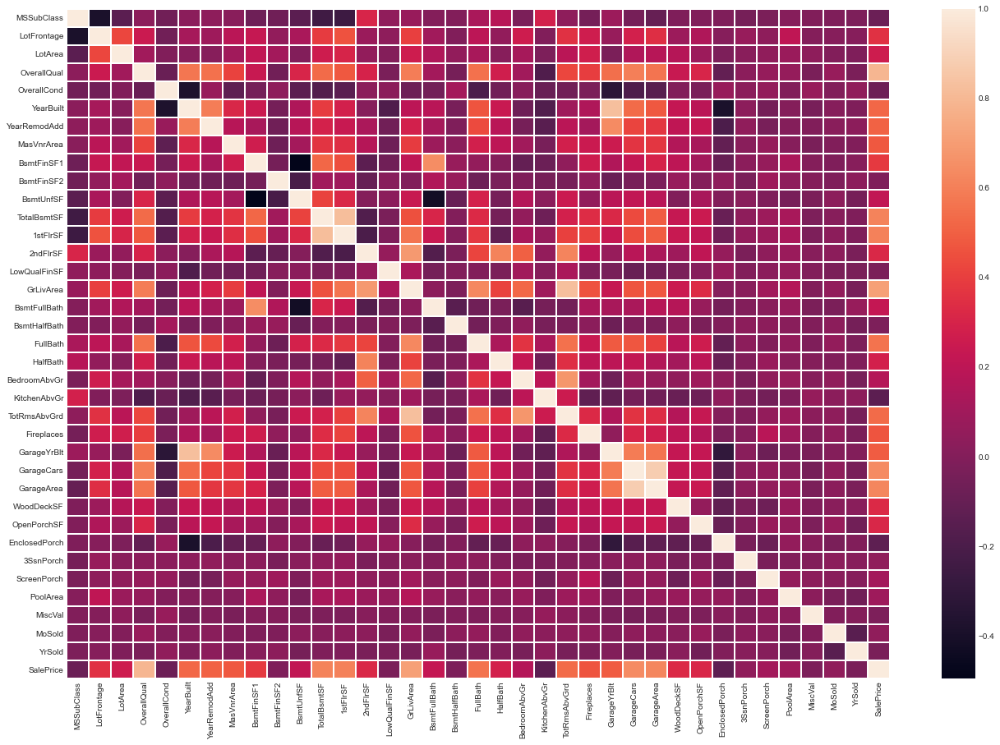

In [29]:
plt.figure(figsize = (20,15))
sns.heatmap(train.corr(),linewidths=1,linecolor='white')

#### Missing Data

In [13]:
missing_values_table(train)

Your selected dataframe has 80 columns.
There are 5 columns that have missing values.


,Missing Values,% of Total Values
LotFrontage,259,17.8
GarageYrBlt,81,5.6
MasVnrType,8,0.5
MasVnrArea,8,0.5
Electrical,1,0.1


<AxesSubplot:>

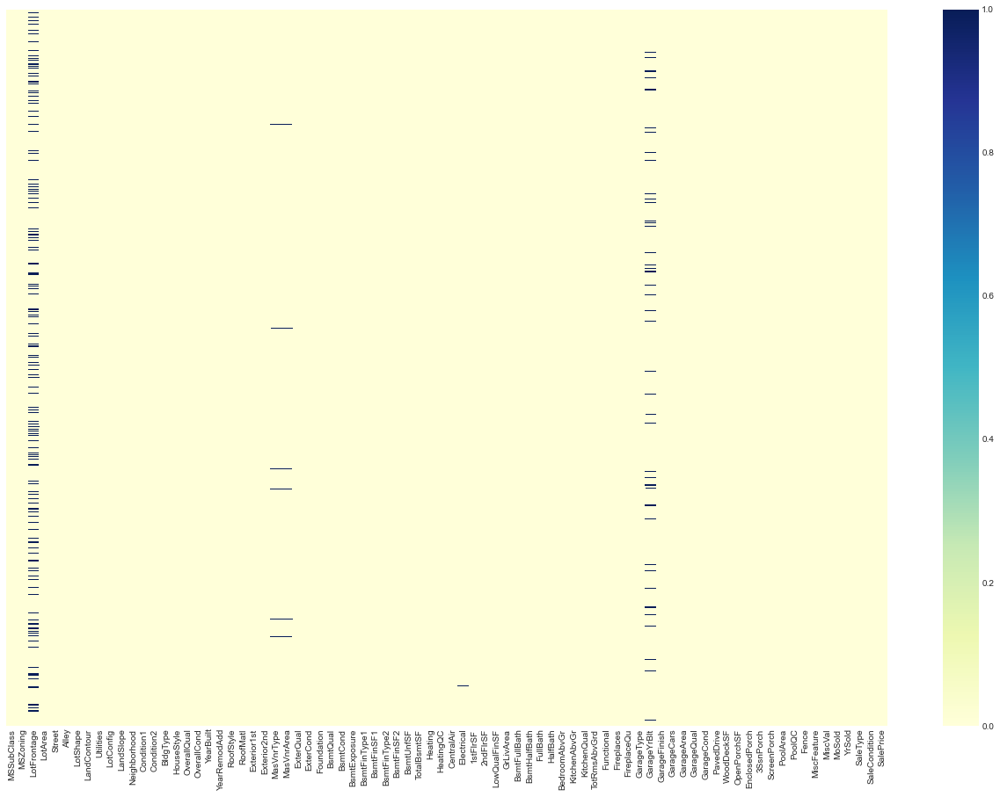

In [14]:
# A visualisation of the missing data
plt.figure(figsize=(20,15))
sns.set_style('white')
sns.heatmap(train.isnull(),yticklabels=False, cmap='YlGnBu')

Question is how to deal with the missing data?
- questions to ask 
    -(feature engineering)
        - looking at factors to related to lot frontage 
    - univariate analysis 
        - the distribution
- possible methods
    - imputation (mean, mode,median)
        - issues (inconsistent bias, changing variation, covariance)
    - remove 
        - like-wise
            - missing completely at random, large dataset, 
        - pair-wise (modelling ignores the missing data)
            - .
        - remove the feature 
            - too many missing values, last case scenario
    - prediction model
    - KNN imputation
    -

# Lot Frontage
- it is numerical so can use a histogram 
- what is the nature of the msZoning missing from others 
    - (missing completely at random) == no systematic difference between missing and not missing (can't have a reason for   missing, i.e.
        - quite rare, there will need to be a proper reason 
    - (missing at randomly) == could be a systematic way to why there is missing values (i.e. Lot frontage area is likely to be missing for houses that don't have a front lot) it can be explained by a observable variable
    - missing not at random
        - can require domain knowledge
- unbiased (if missing at complete random) and power (reducing data points = less predictive power) trade-off?
- can the model / package handle not having complete information

- Questions 
    - why is imputation with randomly missing data* unbiased and statistically valid 
    - what is the importance of distribution 
    - are covariates just features (independent variables)
    - interesting point made for 'missing at random': if i know the observable variables that relate to the nature of the missing data, i can use stratified groups to imputate into the missing values (Statistically this means 'constructing an argument that 'conditions' on a, b, ...,). 
    
    
Of big help on telling the difference between missing at completely random and missing at random (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4121561/#:~:text='Missing%20completely%20at%20random'%20means,missing%20and%20observed%20blood%20pressures.)

<AxesSubplot:xlabel='LotFrontage', ylabel='SalePrice'>

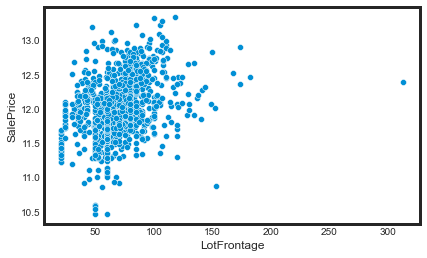

In [15]:
sns.scatterplot(x='LotFrontage',y='SalePrice',data=train)

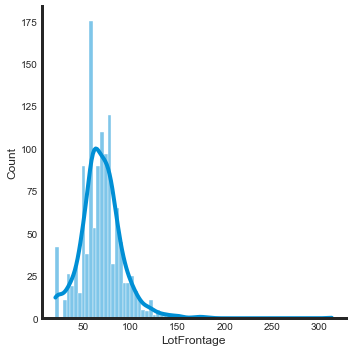

In [16]:
sns.displot(train['LotFrontage'], kde=True)

<AxesSubplot:xlabel='LotFrontage'>

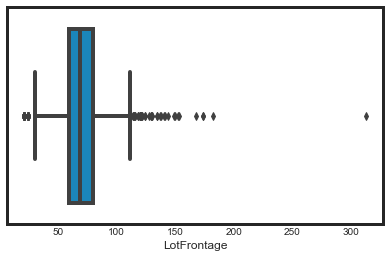

In [17]:
sns.boxplot(x='LotFrontage', data=train)

In [ ]:
outliers on both ends 

###### Should i list-wise (delete the entire feature) (Pair-wise deletion == method without non-null values)
- I initially need to prove that the missinig data is Missing at Complete Random (MACR); this means that there is not relationship between the nature of why there is missing data to another factor. Ways to do this is by understanding the data and/or having domain knowledge. 
- There is no set rule for 

<AxesSubplot:xlabel='LotFrontage', ylabel='SalePrice'>

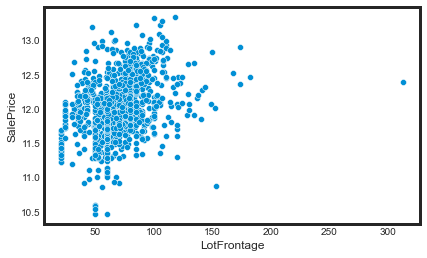

In [18]:
sns.scatterplot(x='LotFrontage',y='SalePrice',data=train)

In [56]:
train['LotFrontage'].corr(train['SalePrice'],method='spearman')

0.4090755179546496

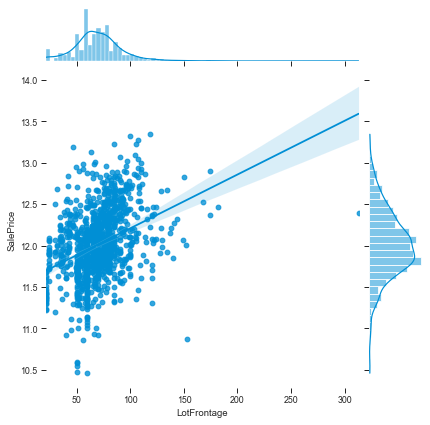

In [26]:
#sns.set_style(style='ticks')
#plt.figure(figsize = (20,15))  # did not do anything
sns.set_context(context='paper', font_scale = 1)
sns.jointplot(x='LotFrontage', y='SalePrice', data=train, kind='reg')
sns.despine(left=True,right=True, top=True, bottom=True)

<AxesSubplot:xlabel='Neighborhood', ylabel='SalePrice'>

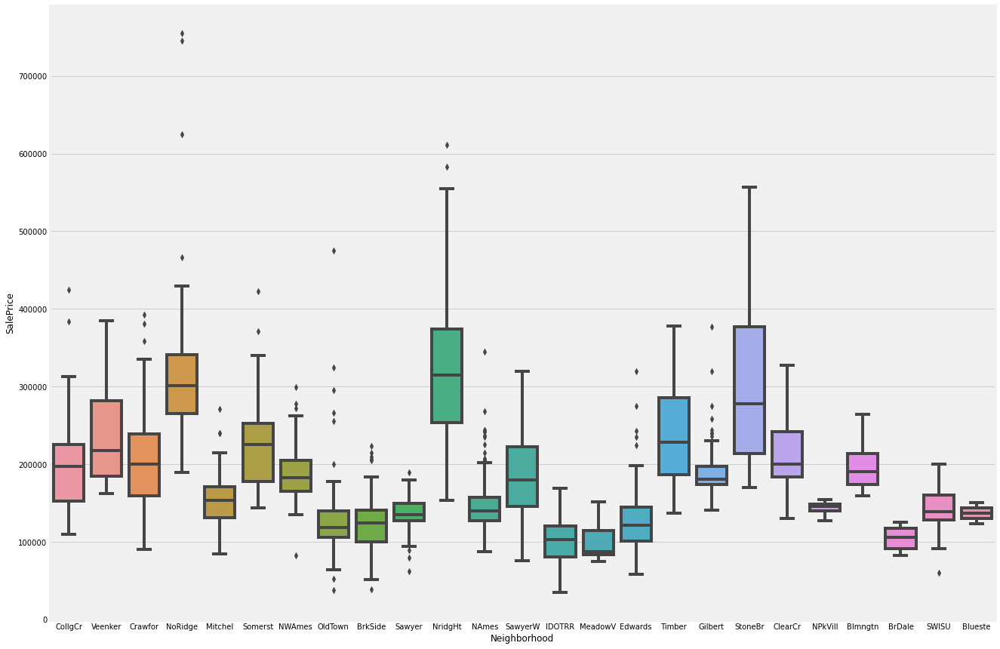

In [32]:
# looking at 
fig, ax = plt.subplots(figsize=(20,15))
sns.boxplot(ax=ax,x='Neighborhood', y='SalePrice', data=train_orig)

## 4) Data exploration

what are we trying to look at:
- Univariate analysis 
    - distribution (for all)
        - do they abide by the assumptions of models 
- bi(more)- variate 
    - correlation (for all)
- Outlier detection

### Dependent variable 

<AxesSubplot:>

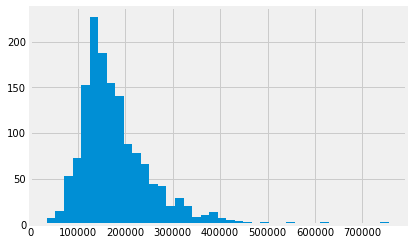

In [9]:
train['SalePrice'].hist(bins = 40)

AttributeError: 'PolyCollection' object has no property 'kind'

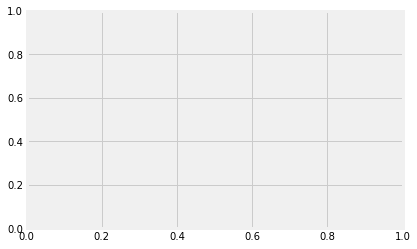

In [10]:
sns.displot(train['SalePrice'], kind='hist',kde=True, binwidth=30000)

- comments for sales price:
    - That the distribution is Right-skewed 
        - how to deal
            - take logs of the variable 
- Disclaimers
    - I have tried different bin sizes and they fit the same look as above

In [53]:
# not done yet! Will do for data transformation 
train['SalePrice'] = np.log1p(train['SalePrice'])

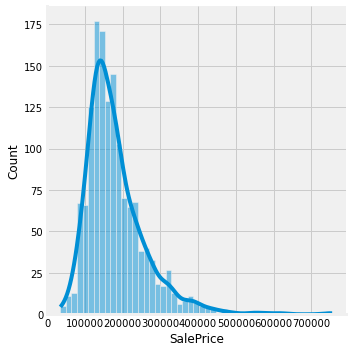

In [11]:
sns.displot(train['SalePrice'], kind='hist',kde=True)

sorted

C:\Users\james\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 mu = 12.02 and sigma = 0.40



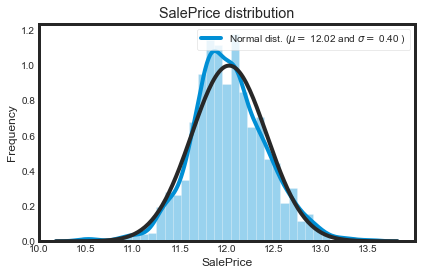

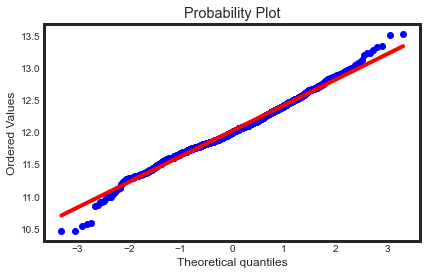

In [57]:
sns.distplot(train['SalePrice'], fit=norm);
# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(train['SalePrice'])                                          #from the scipy.stats library 
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(train['SalePrice'], plot=plt)
plt.show() 

Plotting all variables

### Features 

#### categorical variables 

##### Ordinal

In [26]:
ord_col = ['OverallQual','OverallCond','ExterQual','ExterCond','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1',
           'BsmtFinType2','HeatingQC','KitchenQual','FireplaceQu','GarageFinish','PoolQC']
train[ord_col].head()

,OverallQual,OverallCond,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,KitchenQual,FireplaceQu,GarageFinish,PoolQC
0,7,5,Gd,TA,Gd,TA,No,GLQ,Unf,Ex,Gd,NaN,RFn,NaN
1,6,8,TA,TA,Gd,TA,Gd,ALQ,Unf,Ex,TA,TA,RFn,NaN
2,7,5,Gd,TA,Gd,TA,Mn,GLQ,Unf,Ex,Gd,TA,RFn,NaN
3,7,5,TA,TA,TA,Gd,No,ALQ,Unf,Gd,Gd,Gd,Unf,NaN
4,8,5,Gd,TA,Gd,TA,Av,GLQ,Unf,Ex,Gd,TA,RFn,NaN


In [29]:
len(ord_col)

14

##### Univariate analysis 

In [17]:
for i in ord_col:
    sns.catplot(x = i,y='SalePrice',data = train, kind='bar')

NameError: name 'ord_col' is not defined

#### numerical variables 

In [39]:
num_var= [num_var for num_var in train.columns if train[num_var].dtypes != 'O']
train[num_var].dtypes

MSSubClass         int64
LotFrontage      float64
LotArea            int64
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
MasVnrArea       float64
BsmtFinSF1         int64
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
1stFlrSF           int64
2ndFlrSF           int64
LowQualFinSF       int64
GrLivArea          int64
BsmtFullBath       int64
BsmtHalfBath       int64
FullBath           int64
HalfBath           int64
BedroomAbvGr       int64
KitchenAbvGr       int64
TotRmsAbvGrd       int64
Fireplaces         int64
GarageYrBlt      float64
GarageCars         int64
GarageArea         int64
WoodDeckSF         int64
OpenPorchSF        int64
EnclosedPorch      int64
3SsnPorch          int64
ScreenPorch        int64
PoolArea           int64
MiscVal            int64
MoSold             int64
YrSold             int64
SalePrice          int64
dtype: object

C:\Users\james\Anaconda3\lib\site-packages\seaborn\axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


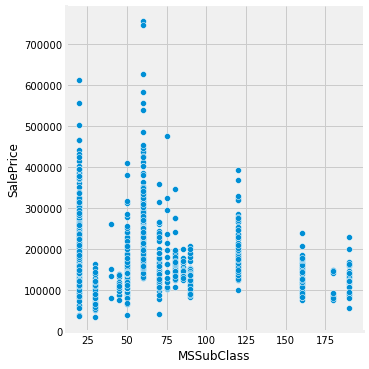

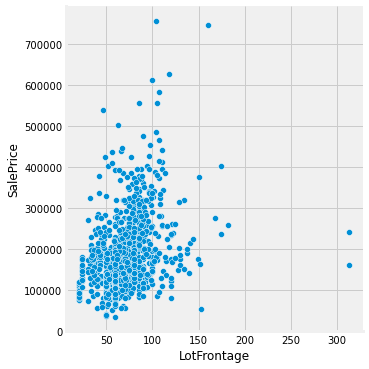

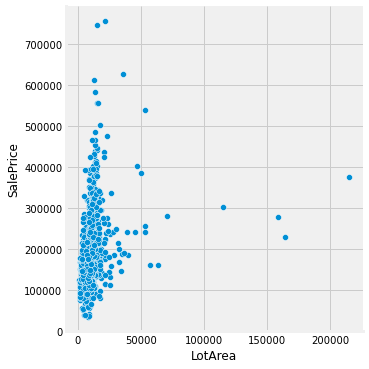

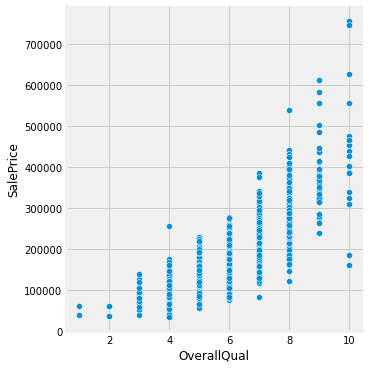

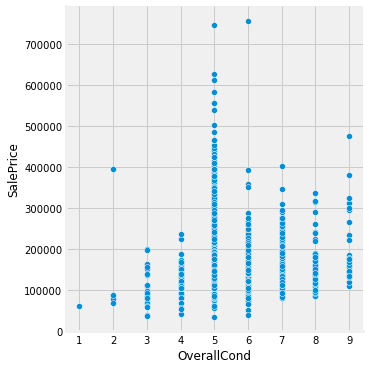

...

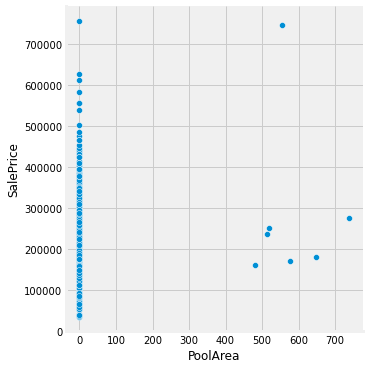

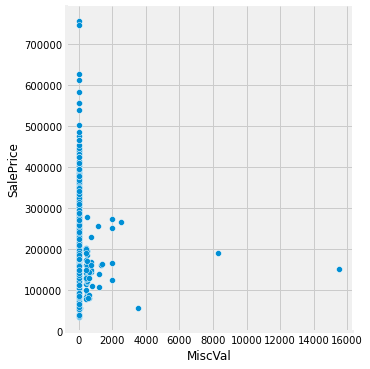

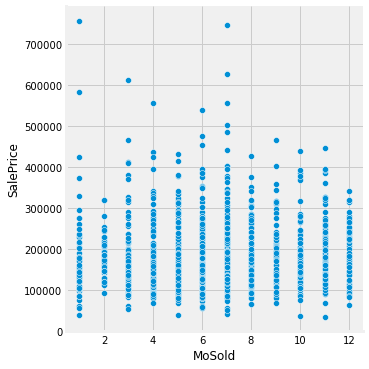

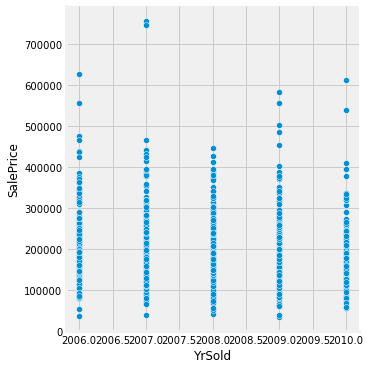

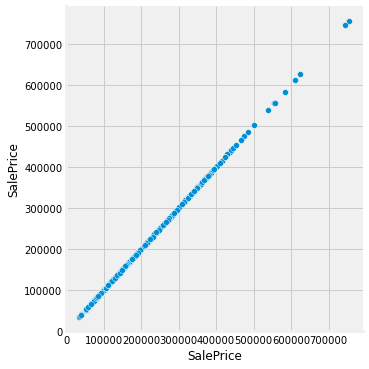

In [39]:
for c in num_var:
    sns.relplot(x=c, y = 'SalePrice', data=train) 

##### Takeaways 
- (follows on from the paper) about the outliers for 'GrLivArea' , will remove houses with a GrLivArea higher than 4'000


In [34]:
train.drop(train[train.GrLivArea > 4000].index, inplace=True)

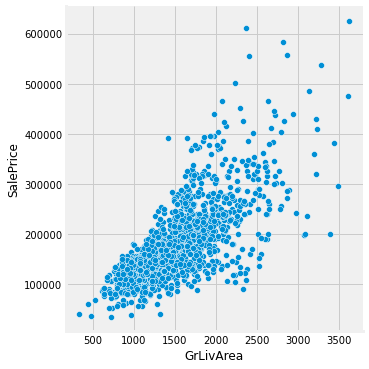

In [37]:
sns.relplot(y='SalePrice',x='GrLivArea', data=train)

C:\Users\james\Anaconda3\lib\site-packages\seaborn\axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


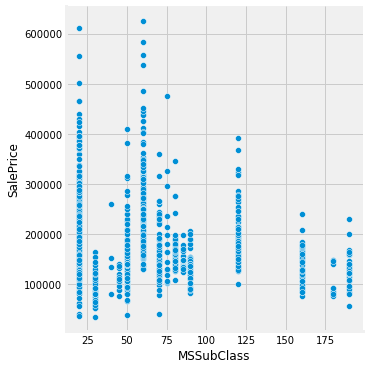

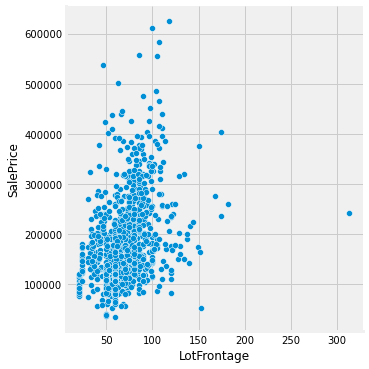

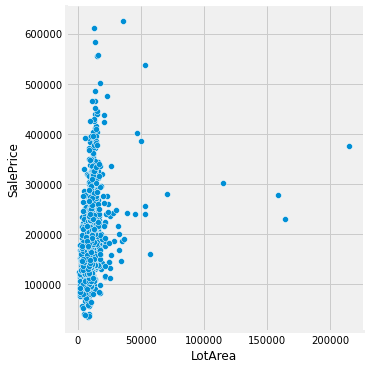

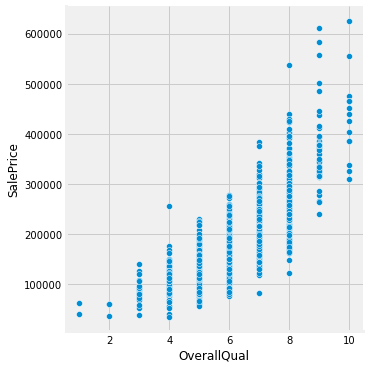

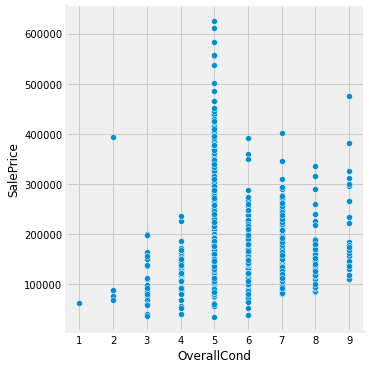

...

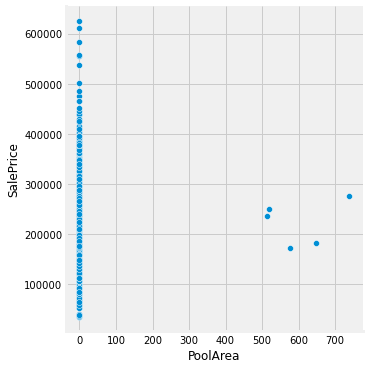

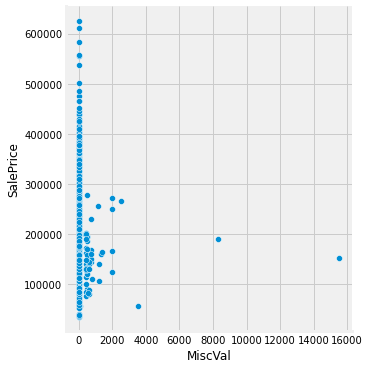

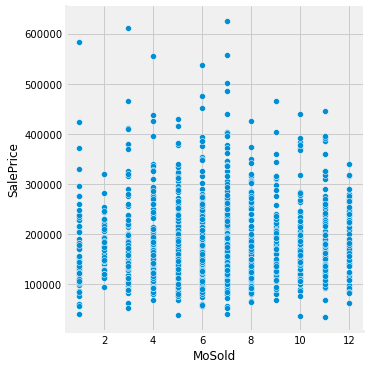

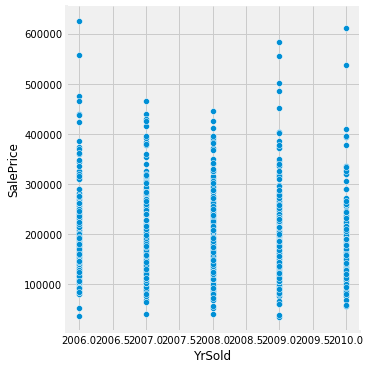

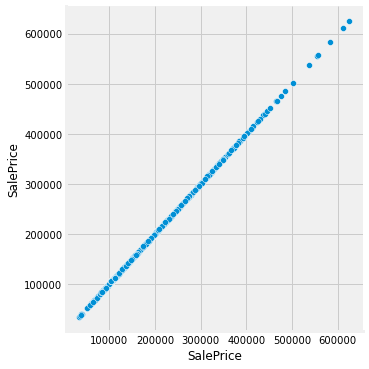

In [40]:
for c in num_var:
    sns.relplot(x=c, y = 'SalePrice', data=train) 

C:\Users\james\Anaconda3\lib\site-packages\seaborn\axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


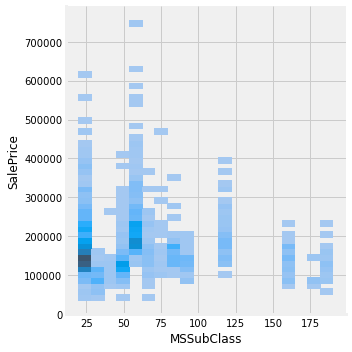

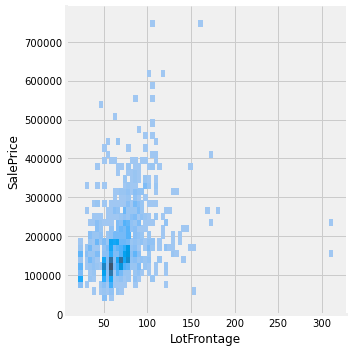

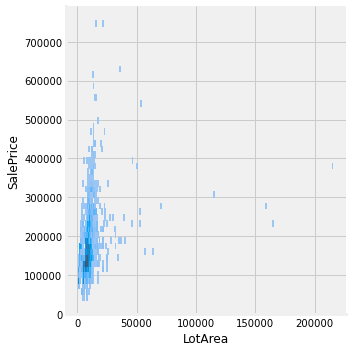

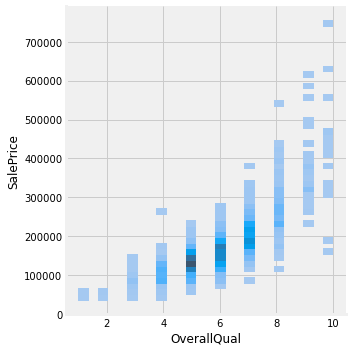

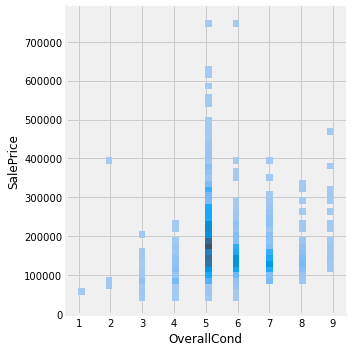

...

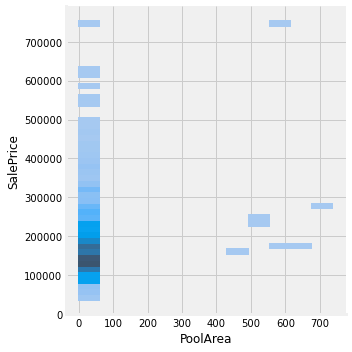

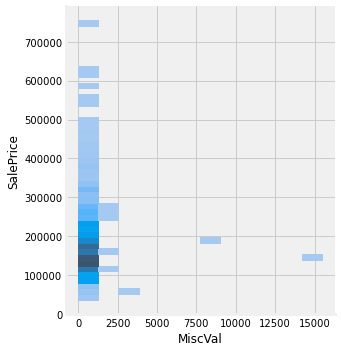

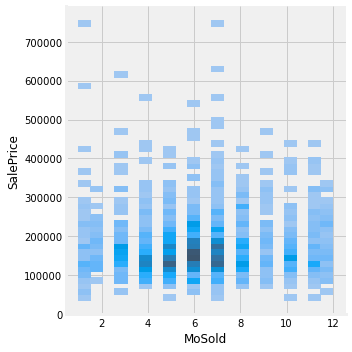

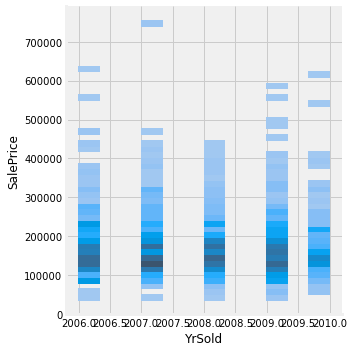

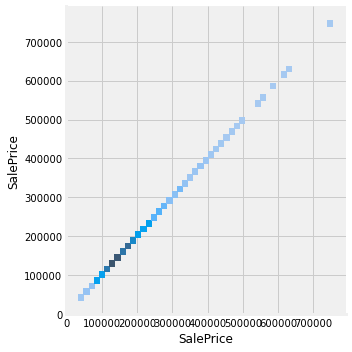

In [33]:
for c in num_var:
    sns.displot(x=c, y = 'SalePrice', data=train) 

C:\Users\james\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<Figure size 1440x1080 with 0 Axes>

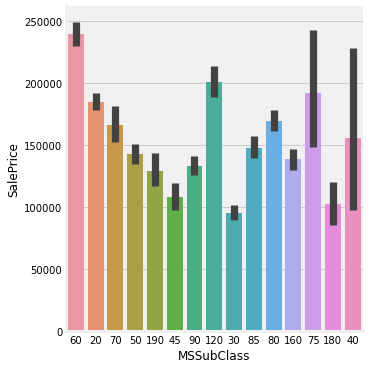

<Figure size 1440x1080 with 0 Axes>

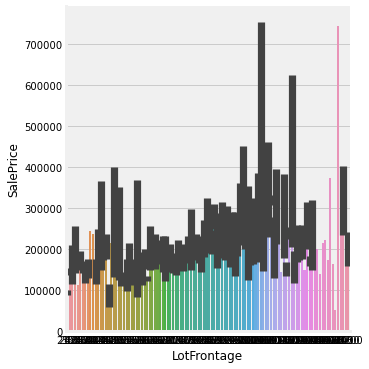

<Figure size 1440x1080 with 0 Axes>

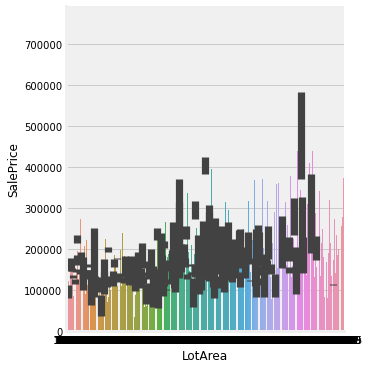

<Figure size 1440x1080 with 0 Axes>

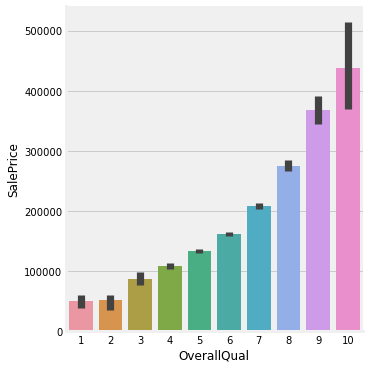

<Figure size 1440x1080 with 0 Axes>

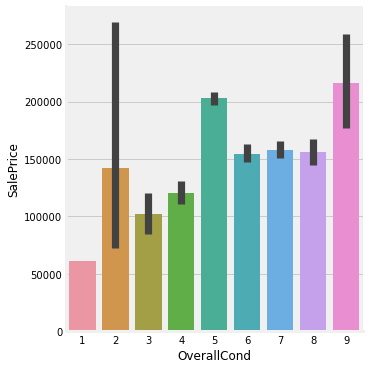

<Figure size 1440x1080 with 0 Axes>

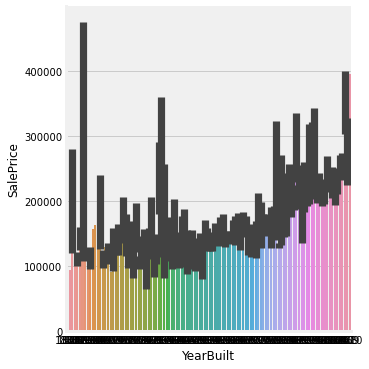

<Figure size 1440x1080 with 0 Axes>

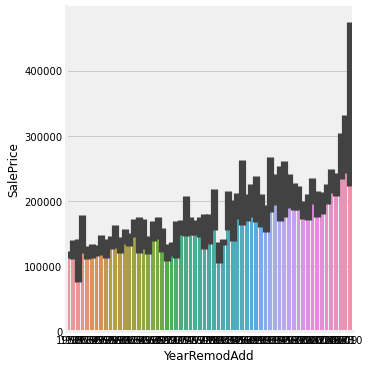

<Figure size 1440x1080 with 0 Axes>

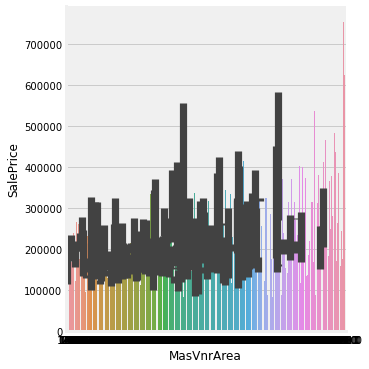

<Figure size 1440x1080 with 0 Axes>

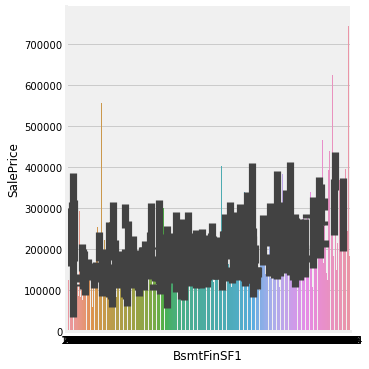

<Figure size 1440x1080 with 0 Axes>

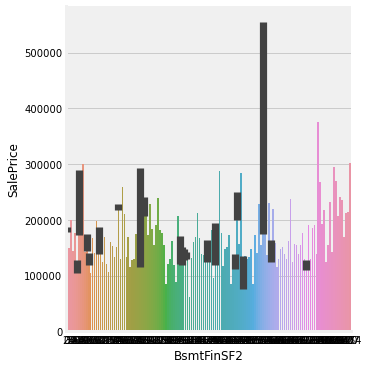

<Figure size 1440x1080 with 0 Axes>

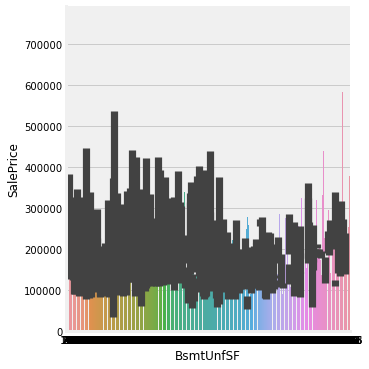

<Figure size 1440x1080 with 0 Axes>

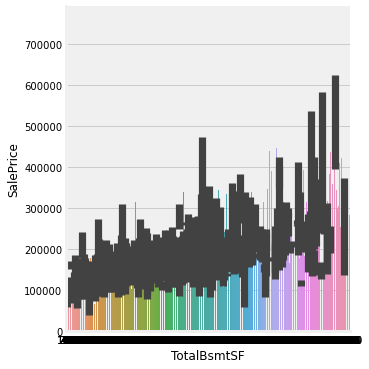

<Figure size 1440x1080 with 0 Axes>

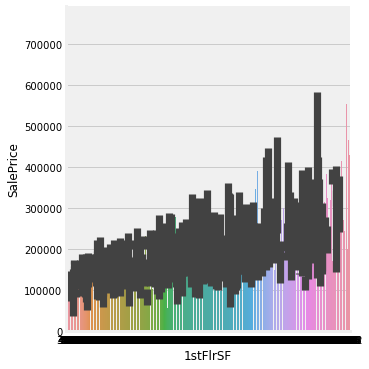

<Figure size 1440x1080 with 0 Axes>

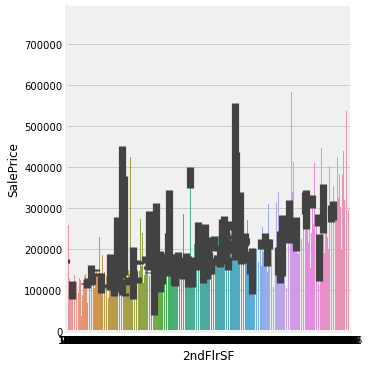

<Figure size 1440x1080 with 0 Axes>

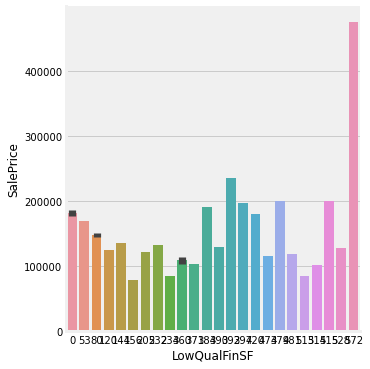

<Figure size 1440x1080 with 0 Axes>

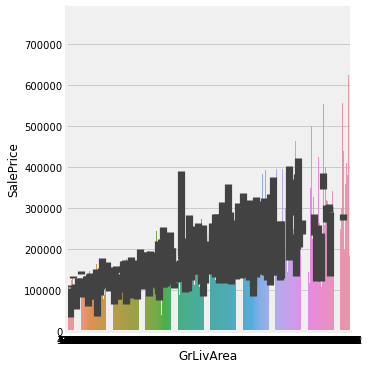

<Figure size 1440x1080 with 0 Axes>

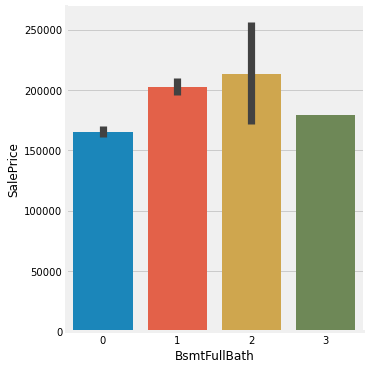

<Figure size 1440x1080 with 0 Axes>

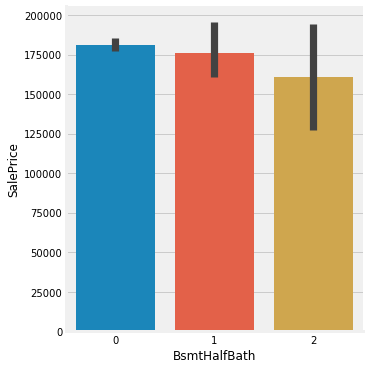

<Figure size 1440x1080 with 0 Axes>

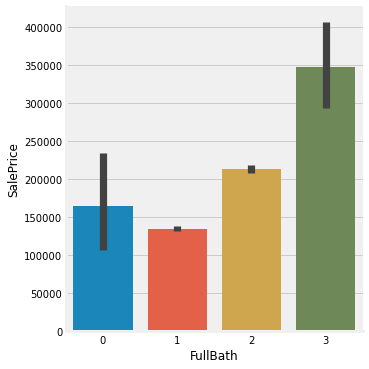

<Figure size 1440x1080 with 0 Axes>

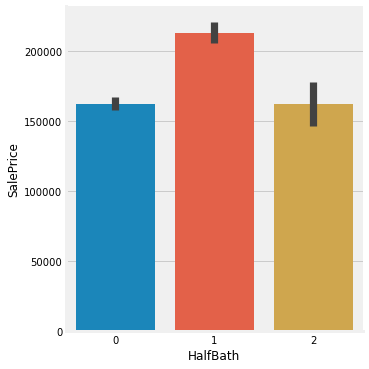

<Figure size 1440x1080 with 0 Axes>

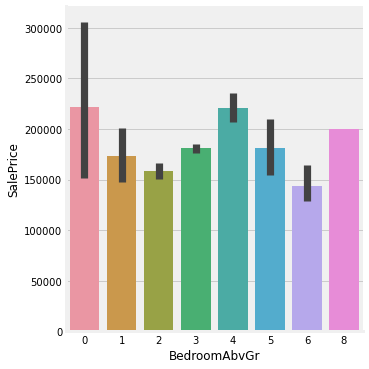

<Figure size 1440x1080 with 0 Axes>

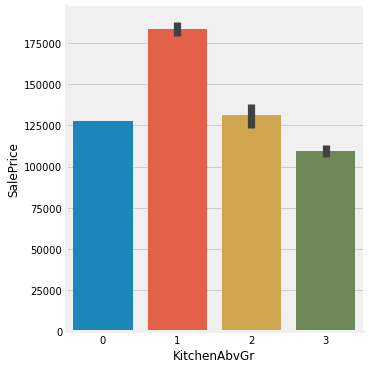

<Figure size 1440x1080 with 0 Axes>

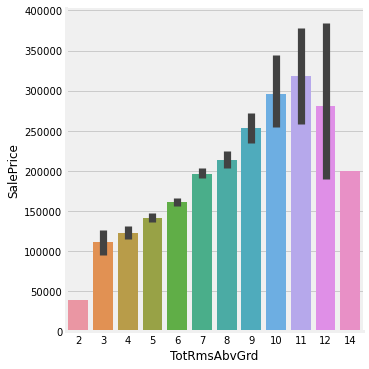

<Figure size 1440x1080 with 0 Axes>

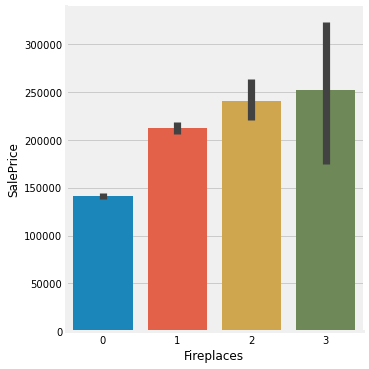

<Figure size 1440x1080 with 0 Axes>

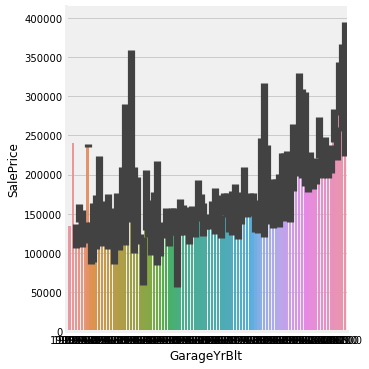

<Figure size 1440x1080 with 0 Axes>

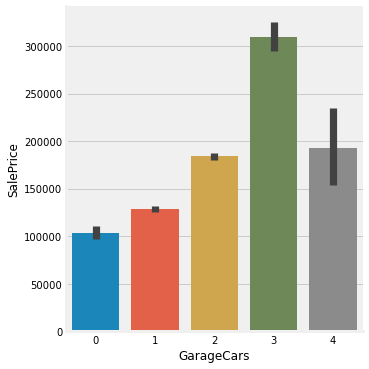

<Figure size 1440x1080 with 0 Axes>

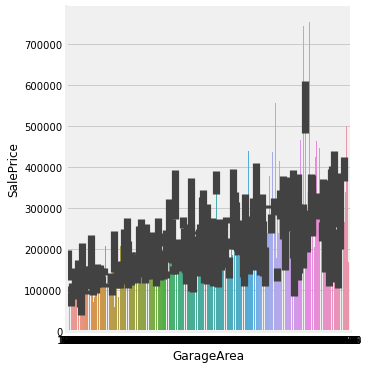

<Figure size 1440x1080 with 0 Axes>

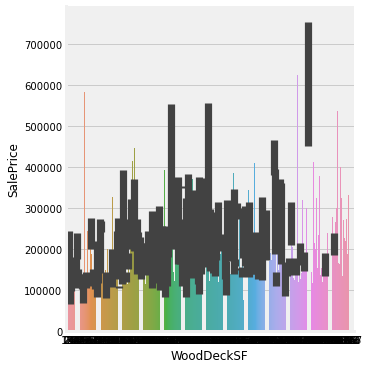

<Figure size 1440x1080 with 0 Axes>

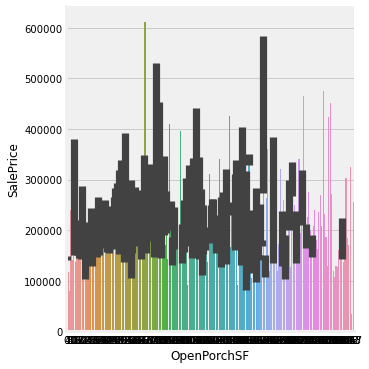

<Figure size 1440x1080 with 0 Axes>

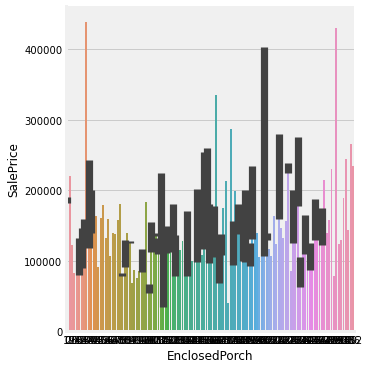

<Figure size 1440x1080 with 0 Axes>

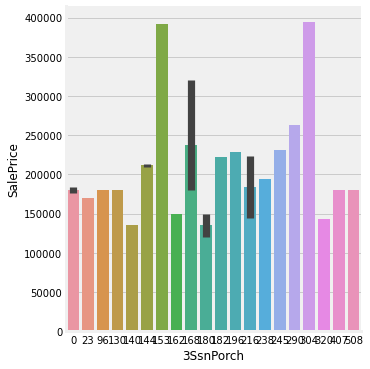

<Figure size 1440x1080 with 0 Axes>

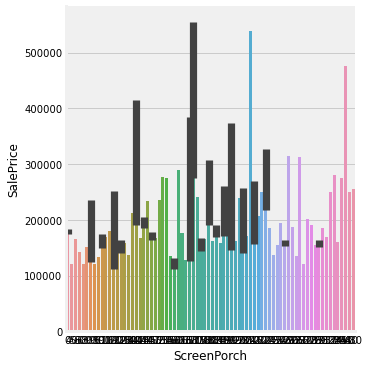

<Figure size 1440x1080 with 0 Axes>

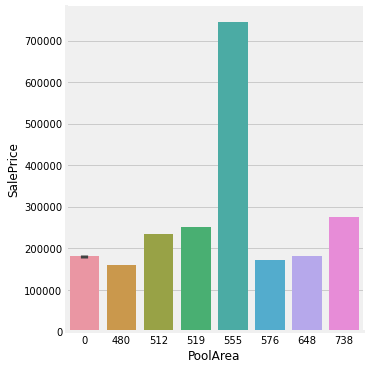

<Figure size 1440x1080 with 0 Axes>

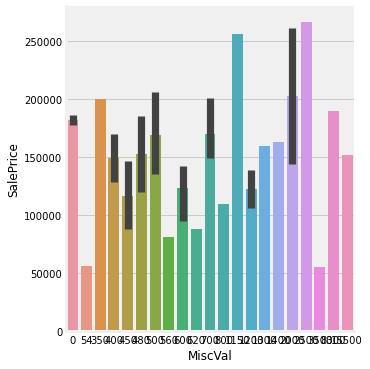

<Figure size 1440x1080 with 0 Axes>

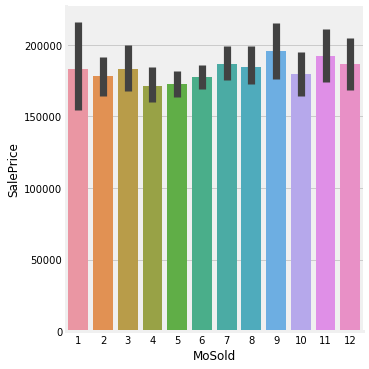

<Figure size 1440x1080 with 0 Axes>

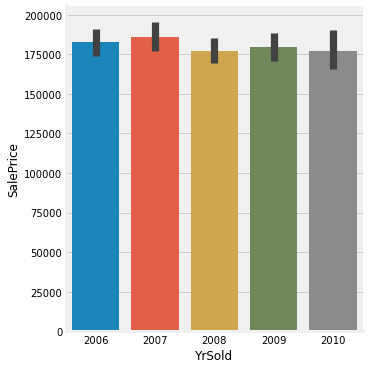

<Figure size 1440x1080 with 0 Axes>

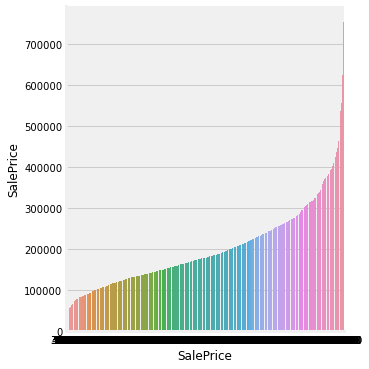

In [64]:
for c in num_var:
    plt.figure(figsize=(20,15))
    sns.catplot(x=c, y = 'SalePrice', data=train, kind='bar') 

In [63]:
train_features = train.drop(['SalePrice'], axis=1)
test_features = test
features = pd.concat([train_features, test_features]).reset_index(drop=True)
features
features.shape

(2919, 79)

In [64]:
train.head(5)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,None,None,None,0,2,2008,WD,Normal,12.247699
1,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,None,None,None,0,5,2007,WD,Normal,12.109016
2,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,None,None,None,0,9,2008,WD,Normal,12.317171
3,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,None,None,None,0,2,2006,WD,Abnorml,11.849405
4,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,None,None,None,0,12,2008,WD,Normal,12.429220


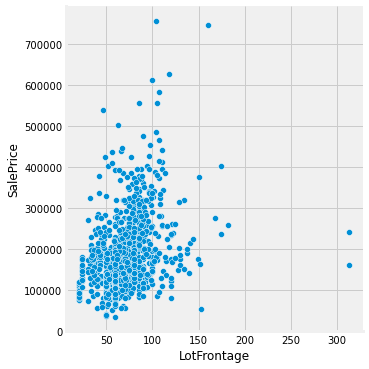

In [12]:
sns.relplot(x='LotFrontage', y = 'SalePrice', data=train)

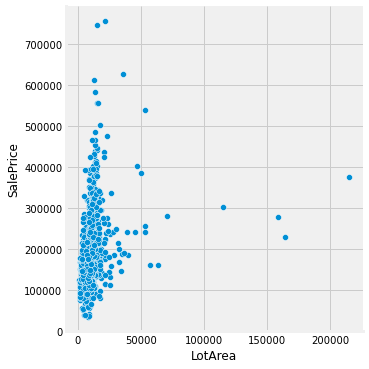

In [13]:
sns.relplot(x='LotArea', y = 'SalePrice', data=train)

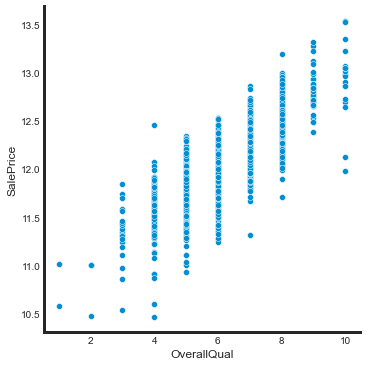

In [76]:
sns.relplot(x='OverallQual', y = 'SalePrice', data=train)

<AxesSubplot:xlabel='OverallQual', ylabel='SalePrice'>

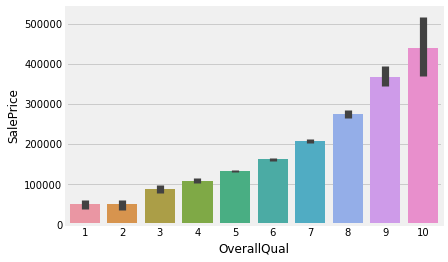

In [16]:
sns.barplot(x='OverallQual',y='SalePrice',data=train)

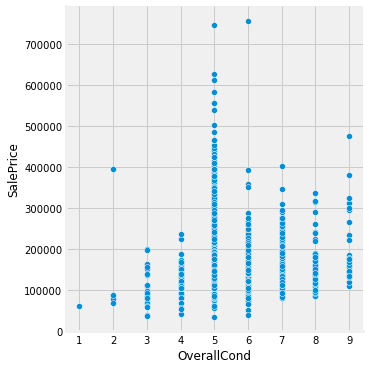

In [15]:
sns.relplot(x='OverallCond', y = 'SalePrice', data=train)

In [71]:
train.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,None,None,None,0,2,2008,WD,Normal,12.247699
1,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,None,None,None,0,5,2007,WD,Normal,12.109016
2,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,None,None,None,0,9,2008,WD,Normal,12.317171
3,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,None,None,None,0,2,2006,WD,Abnorml,11.849405
4,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,None,None,None,0,12,2008,WD,Normal,12.429220
5,50,RL,85.0,14115,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,None,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,None,MnPrv,Shed,700,10,2009,WD,Normal,11.870607
6,20,RL,75.0,10084,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,None,None,None,0,8,2007,WD,Normal,12.634606
7,60,RL,NaN,10382,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,None,None,Shed,350,11,2009,WD,Normal,12.206078
8,50,RM,51.0,6120,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,None,None,None,0,4,2008,WD,Abnorml,11.774528
9,190,RL,50.0,7420,Pave,None,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,Br

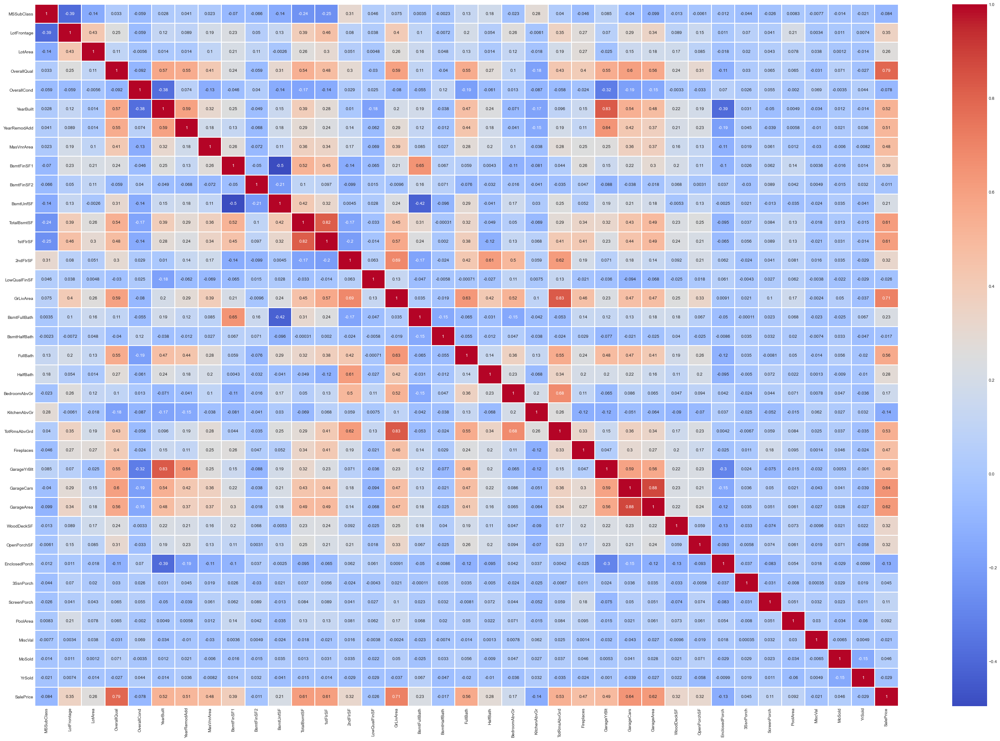

In [39]:
# can be used to see what features are correlated with each other and more importantly with the sales price 
# is used for the numerical values 
plt.figure(figsize=(40,30))
sns.heatmap(train.corr(),cmap='coolwarm',annot = True, linewidths=1,linecolor='white',)
plt.show()

C:\Users\james\Anaconda3\lib\site-packages\dabl\plot\supervised.py:540: FutureWarning: The second positional argument of plot is a Series 'y'. If passing a column name, use a keyword.
  FutureWarning)
C:\Users\james\Anaconda3\lib\site-packages\dabl\preprocessing.py:352: UserWarning: Discarding near-constant features: ['Street', 'Utilities', 'Condition2', 'RoofMatl', 'Heating', 'LowQualFinSF', 'KitchenAbvGr', 'GarageQual', 'GarageCond', '3SsnPorch', 'PoolArea', 'MiscVal']
  near_constant.index[near_constant].tolist()))


Target looks like regression
Showing only top 10 of 22 continuous features


C:\Users\james\Anaconda3\lib\site-packages\dabl\plot\utils.py:630: UserWarning: Dropped 3 outliers in column GrLivArea.
  int(dropped), series.name), UserWarning)
C:\Users\james\Anaconda3\lib\site-packages\dabl\plot\utils.py:630: UserWarning: Dropped 1 outliers in column TotalBsmtSF.
  int(dropped), series.name), UserWarning)
C:\Users\james\Anaconda3\lib\site-packages\dabl\plot\utils.py:630: UserWarning: Dropped 3 outliers in column 1stFlrSF.
  int(dropped), series.name), UserWarning)
C:\Users\james\Anaconda3\lib\site-packages\dabl\plot\utils.py:630: UserWarning: Dropped 2 outliers in column MasVnrArea.
  int(dropped), series.name), UserWarning)


Showing only top 10 of 45 categorical features


C:\Users\james\Anaconda3\lib\site-packages\dabl\plot\utils.py:373: UserWarning: FixedFormatter should only be used together with FixedLocator
  for t in ax.get_xticklabels()]
C:\Users\james\Anaconda3\lib\site-packages\dabl\plot\utils.py:373: UserWarning: FixedFormatter should only be used together with FixedLocator
  for t in ax.get_xticklabels()]
C:\Users\james\Anaconda3\lib\site-packages\dabl\plot\utils.py:373: UserWarning: FixedFormatter should only be used together with FixedLocator
  for t in ax.get_xticklabels()]
C:\Users\james\Anaconda3\lib\site-packages\dabl\plot\utils.py:373: UserWarning: FixedFormatter should only be used together with FixedLocator
  for t in ax.get_xticklabels()]
C:\Users\james\Anaconda3\lib\site-packages\dabl\plot\utils.py:373: UserWarning: FixedFormatter should only be used together with FixedLocator
  for t in ax.get_xticklabels()]
C:\Users\james\Anaconda3\lib\site-packages\dabl\plot\utils.py:373: UserWarning: FixedFormatter should only be used together w

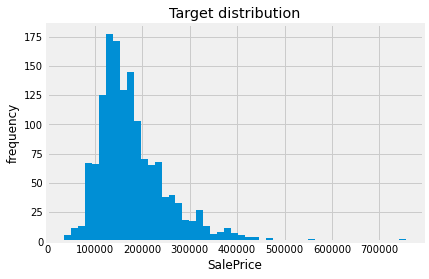

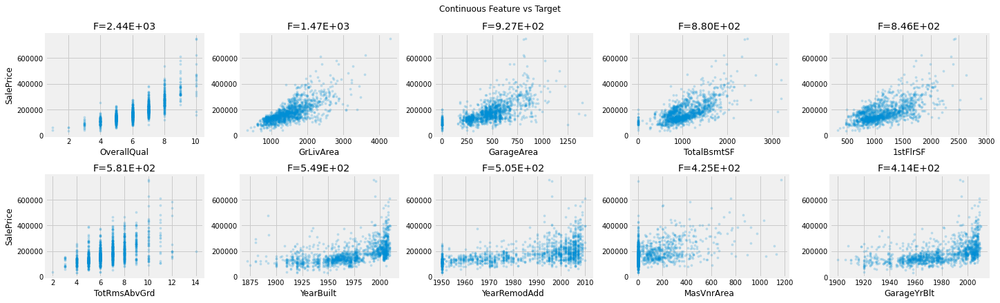

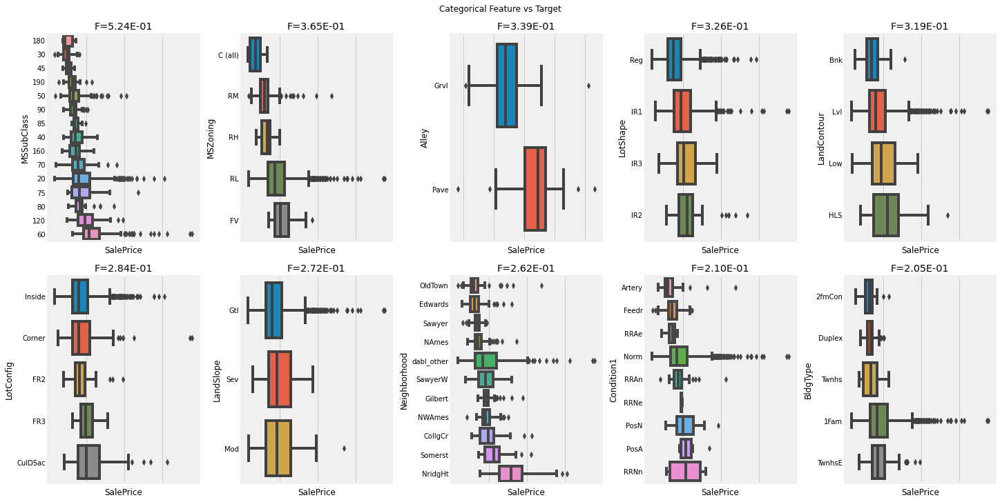

In [84]:
import dabl
dabl.plot(train, 'SalePrice')

In [83]:
pip install dabl

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: threadpoolctl>=2.0.0 in c:\users\james\anaconda3\lib\site-packages (from scikit-learn->dabl) (2.1.0)

  Created wheel for dabl: filename=dabl-0.1.9-py3-none-any.whl size=572793 sha256=321d970f55744d4f495a840d868e24438e79d9d6ace053b3f305e21869621f67
  Stored in directory: c:\users\james\appdata\local\pip\cache\wheels\aa\38\8f\66d5e159658b37cb0b8f9176a9f584f14bcd5ea0c1e96011bf
Successfully built dabl


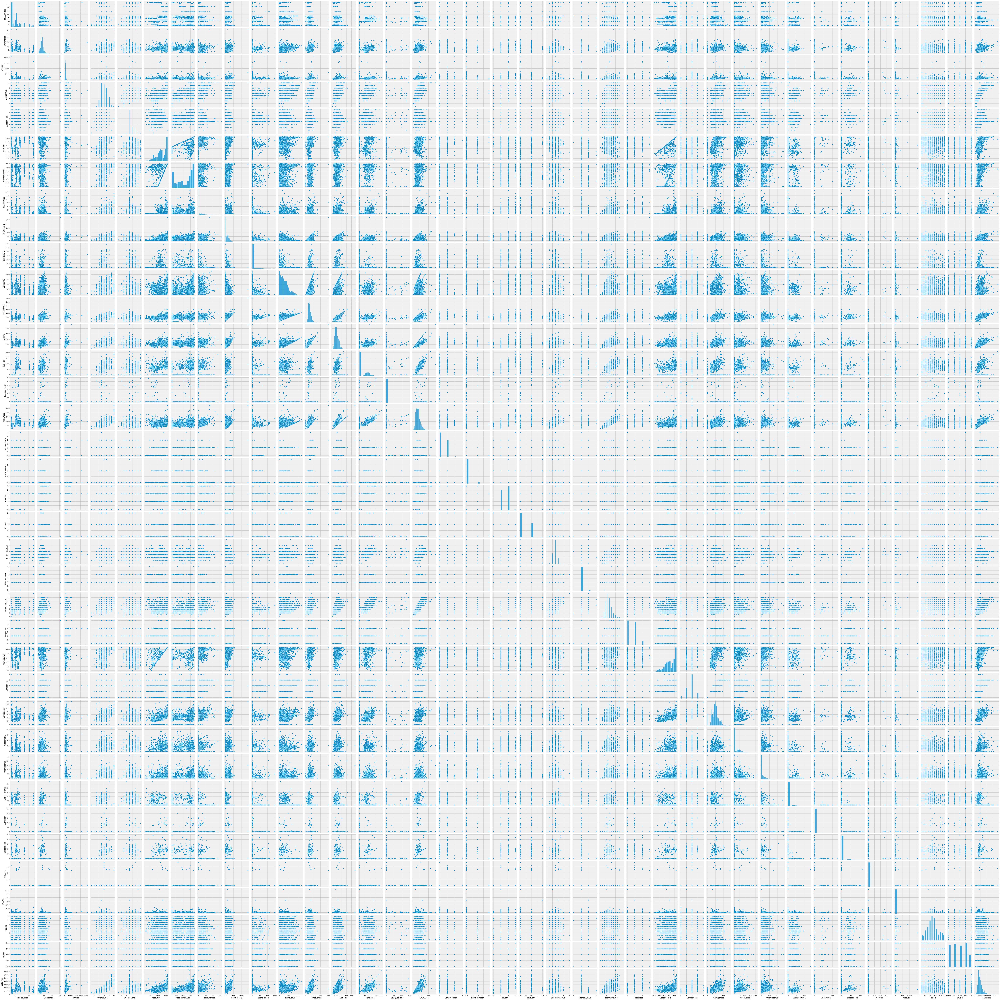

In [9]:
sns.pairplot(train)

In [63]:
train.GarageArea.head(10)

0    548
1    460
2    608
3    642
4    836
5    480
6    636
7    484
8    468
9    205
Name: GarageArea, dtype: int64

In [67]:
train[['GarageArea']].head(5)

,GarageArea
0,548
1,460
2,608
3,642
4,836


## 3) Data preparing 

### Data Cleaning 

In [5]:
# To see how many houses and columns 
print('The shape of the data is {}'.format(df.shape))
# To look at the null values and datatypes
print(df.info())
#to look summary statistics (only for numerical datatypes)
df.describe()

The shape of the data is (1460, 80)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 1 to 1460
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


## Feature engineering 

improvements:
- to concenate the training and testing dataset. important to know the amount of rows for each dataset 

### Sorting out datatypes

In [ ]:
converting:
    Numerical:
        continuous:
            interval:
            ratio:
                LotFrontage (can change to int),LotArea,MasVnrArea(can change to int),BsmtUnfSF,TotalBsmtSF,1stFlrSF,
                2ndFlrSF,LowQualFinSF,GrLivArea
        discrete:
                have finite variable(should be discrete)(BsmtFullBath(?),BsmtHalfBath(?),FullBath(?),HalfBath(?),
                                                         Bedroom,KitchenAbvGr,TotRmsAbvGrd 
                TotRmsAbvGrd,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal
                
    categorical:
        ***nominal***:
            MSSubClass->,Street,Alley(change->none),LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,
            Condition1,Condition2,BldgType,HOUSESTYLE(?),YearBuilt->(?),RoofStyle,RoofMatl,Exterior1st,Exterior2nd,
            MasVnrType, Foundation,Heating,CentralAir(?=just do the dummy),Electrical,Functional,GarageType,PavedDrive,
            MiscFeature,SaleType,SaleCondition, Fence(***)
            
        ***ordinal***:
            OverallQual(fine),OverallCond(fine), ExterQual(order done),ExterCond(order done),BsmtQual(order done),BsmtCond(order done),BsmtExposure(order done),BsmtFinType1(order done)
            BsmtFinType2(order done),HeatingQC(order done),KitchenQual(order done),FireplaceQu(order done),GarageFinish(order done),PoolQC(order done)   
    date:
        YearBuilt->(?),GarageYrBlt(?),MoSold(change to rep months), YrSold
questions:
    - ***putting HOUSESTYLE in ordinal or nominal. I will initially put it in nominal***
    - ***how to indicate an object is ordinal rather than nominal*** 
    - ***how to deal with YearBuilt*** = years since then 
    - how to deal with YearRemodAdd? should i use this instead of yearbuilt, does the 'year built' have an effect on price even if remodelled 
    - how to deal with order but one option is zero 
    - ***what datatype would a binary variable go (CentralAir)*** = just nominal with no as blank
    - do i have to do anything different with discrete variable 
    - how to sort order of ordinal variables  
    - ***Fence --- i could split up [(GdPrv,MnPrv),(GdWo,MnWw),NA] but what to do with NA == no fence***

### Missing Data  

In [65]:
# Function to calculate missing values by column
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = (100 * df.isnull().sum()) / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [67]:
missing_values_table(train)

Your selected dataframe has 80 columns.
There are 5 columns that have missing values.


,Missing Values,% of Total Values
LotFrontage,259,17.7
GarageYrBlt,81,5.5
MasVnrType,8,0.5
MasVnrArea,8,0.5
Electrical,1,0.1


In [15]:
train.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 80, dtype: int64

In [31]:
for i in df.columns:
    if df[str(i)].isna().sum() > 0:
        print("column {} has {} missing values".format(i,df_missing_data[str(i)].isna().sum()))

column LotFrontage has 259 missing values
column MasVnrType has 8 missing values
column MasVnrArea has 8 missing values
column Electrical has 1 missing values
column GarageYrBlt has 81 missing values


Now how to deal with these missing values:
- lot frontage 
    - solutions 
        - can have a look at if there is anymore details on the lot frontage, if not then we can put these as zero
            - no, they still have lotarea 
- Masonry veneer type
    - solution 
        - same amount of missing data as masonry veneer in square feet 
        1) w
- Masonry veneer area in square feet
    - ideas
        - the action taken for the above will need to be applied here also
- Electrical system
    - observation 
        - no NA =???, therefore no straight substitution 
        - only 1 recording though
    - action 
        - delete the row 
- Year garage was built
Thoughts:
- initial (1-remove, imputation (mean/median), make a model for it 

##### to find out the best way to fill in the missing data 
- removal 
- imputation (mean, mode, median)
- prediction model 
- KNN imputation 

###### me
1) i could try all the methods above and take the one with the best results 
2) have some look at the distribution of each variable 

In [47]:
#removing the missing value row for 'electrical'
df_missing_data = df_missing_data.dropna(subset=['Electrical'])


In [35]:
df[pd.isnull(df["MasVnrType"])]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
235,60,RL,NaN,7851,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,625,Unf,0,235,860,GasA,Ex,Y,SBrkr,860,1100,0,1960,1,0,2,1,4,1,Gd,8,Typ,2,TA,BuiltIn,2002.0,Fin,2,440,TA,TA,Y,288,48,0,0,0,0,None,None,None,0,5,2010,WD,Normal,216500
530,20,RL,NaN,32668,Pave,None,IR1,Lvl,AllPub,CulDSac,Gtl,Crawfor,Norm,Norm,1Fam,1Story,6,3,1957,1975,Hip,CompShg,Wd Sdng,Stone,NaN,NaN,Gd,TA,PConc,TA,TA,No,Rec,1219,Unf,0,816,2035,GasA,TA,Y,SBrkr,2515,0,0,2515,1,0,3,0,4,2,TA,9,Maj1,2,TA,Attchd,1975.0,RFn,2,484,TA,TA,Y,0,0,200,0,0,0,None,None,None,0,3,2007,WD,Alloca,200624
651,60,FV,65.0,8125,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,2Story,7,6,2007,2007,Gable,CompShg,CemntBd,CmentBd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,813,813,GasA,Ex,Y,SBrkr,822,843,0,1665,0,0,2,1,3,1,Gd,7,Typ,0,None,Attchd,2007.0,RFn,2,562,TA,TA,Y,0,0,0,0,0,0,None,None,None,0,5,2008,WD,Normal,205950
937,20,RL,67.0,10083,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,833,Unf,0,343,1176,GasA,Ex,Y,SBrkr,1200,0,0,1200,1,0,2,0,2,1,Gd,5,Typ,0,None,Attchd,2003.0,RFn,2,555,TA,TA,Y,0,41,0,0,0,0,None,None,None,0,8,2009,WD,Normal,184900
974,20,FV,95.0,11639,Pave,None,Reg,Lvl,AllPub,Corner,Gtl,Somerst,Norm,Norm,1Fam,1Story,7,5,2007,2008,Gable,CompShg,CemntBd,CmentBd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,1428,1428,GasA,Ex,Y,SBrkr,1428,0,0,1428,0,0,2,0,3,1,Gd,6,Typ,0,None,Attchd,2007.0,Fin,2,480,TA,TA,Y,0,120,0,0,0,0,None,None,None,0,12,2008,New,Partial,182000
978,120,FV,35.0,4274,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,TwnhsE,1Story,7,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,1106,Unf,0,135,1241,GasA,Ex,Y,SBrkr,1241,0,0,1241,1,0,1,1,1,1,Gd,4,Typ,0,None,Attchd,2007.0,Fin,2,569,TA,TA,Y,0,116,0,0,0,0,None,None,None,0,11,2007,New,Partial,199900
1244,20,RL,107.0,13891,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,10,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Ex,TA,PConc,Ex,Gd,Gd,GLQ,1386,Unf,0,690,2076,GasA,Ex,Y,SBrkr,2076,0,0,2076,1,0,2,1,2,1,Ex,7,Typ,1,Gd,Attchd,2006.0,Fin,3,850,TA,TA,Y,216,229,0,0,0,0,None,None,None,0,9,2006,New,Partial,465000
1279,60,RL,75.0,9473,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,804,Unf,0,324,1128,GasA,Ex,Y,SBrkr,1128,903,0,2031,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2002.0,RFn,2,577,TA,TA,Y,0,211,0,0,0,0,None,None,None,0,3,2008,WD,Normal,237000


In [40]:
df['MasVnrType'].isna()

Id
1       False
2       False
3       False
4       False
5       False
        ...  
1456    False
1457    False
1458    False
1459    False
1460    False
Name: MasVnrType, Length: 1460, dtype: bool

In [22]:
df['BsmtFinType1'].value_counts()

Unf     430
GLQ     418
ALQ     220
BLQ     148
Rec     133
LwQ      74
None     37
Name: BsmtFinType1, dtype: int64

In [4]:
# importing libraries
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, OrdinalEncoder
from sklearn.pipeline import Pipeline


##### Column transformation

In [14]:
#ordinal
## sorting out orders 
ExterQual_order = ['Po','Fa','TA','Gd','Ex']
ExterCond_order = ['Po','Fa','TA','Gd','Ex']
HeatingQC_order = ['Po','Fa','TA','Gd','Ex']
KitchenQual_order = ['Po','Fa','TA','Gd','Ex']
BsmtQual_order = ['NA','Po','Fa','TA','Gd','Ex']
BsmtCond_order = ['NA','Po','Fa','TA','Gd','Ex']
FireplaceQu_order = ['NA','Po','Fa','TA','Gd','Ex']
BsmtExposure_order = ['NA','No','Mn','Av','Gd']
BsmtFinType1_order = ['NA','Unf','LwQ','Rec','BLQ','ALQ','GLQ']
BsmtFinType2_order = ['NA','Unf','LwQ','Rec','BLQ','ALQ','GLQ']
GarageFinish_order = ['NA','Unf','RFn','Fin']
PoolQC_order = ['NA','Fa','TA','Gd','Ex']

## in a legible form
ordinal_order = ['ExterQual_order','ExterCond_order','HeatingQC_order','KitchenQual_order','BsmtQual_order',
                  'BsmtCond_order','FireplaceQu_order','BsmtExposure_order','BsmtFinType1_order','BsmtFinType2_order',
                  'GarageFinish_order','PoolQC_order']
ordinal_names = ['ExterQual','ExterCond','HeatingQC','KitchenQual','BsmtQual',
                  'BsmtCond','FireplaceQu','BsmtExposure','BsmtFinType1','BsmtFinType2',
                  'GarageFinish','PoolQC']
ordinal = OrdinalEncoder(categories = [ordinal_order],dtype='int')
#ordinal.fit(df[[ordinal_names]])

# nominal
## sorting out names 
nominal_names = ['MSSubClass','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood',
                'Condition1','Condition2','BldgType','HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',
                'MasVnrType','Foundation','Heating','CentralAir','Electrical','Functional','GarageType','PavedDrive',
                'MiscFeature','SaleType','SaleCondition','Fence']
encoder = OneHotEncoder(drop='first',sparse=False,dtype='int')
#df[nominal_names] = encoder.fit_transform(df[[nominal_names]])

In [32]:
#column transformer
t = [('ordinal',ordinal,ordinal_names),('nominal',encoder,nominal_names)]
col_transform = ColumnTransformer(transformers=t,remainder='passthrough')

In [33]:
col_transform.fit_transform(df)

ValueError: Input contains NaN

In [18]:
#dealing with YearBuilt & YearRemodAdd
import datetime
year_now = datetime.datetime.now().year
df.YearBuilt = year_now - df.YearBuilt
df.YearRemodAdd = year_now - df.YearRemodAdd
#changing the names to be more accurate 
df.rename(columns={'YearBuilt':'YearsSinceBuilt','YearRemodAdd':'YearsSinceRemod'}, inplace=True)

In [ ]:
#for two categories
pets_order = ['Dog','Cat','Rabbit','Fish']
conditions_order = ['Bad','Good','Exceptional']
column_names = df.columns
ordinal = OrdinalEncoder(categories=[pets_order, conditions_order],dtype='int')
#print(df)
#print(ordinal)
ordinal.fit(df)
df = ordinal.transform(df)
#print(ordinal.categories_)
df = pd.DataFrame(df)
df.columns = fish
df

In [19]:
ext_ord = OrdinalEncoder(categories=['Po','Fa','TA','Gd','Ex'],dtype='numpy.int64')

In [3]:
help(ColumnTransformer)

NameError: name 'ColumnTransformer' is not defined

In [22]:
df['MSSubClass'] = str(df['MSSubClass'])
df.dtypes

MSSubClass        object
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 80, dtype: object

### Looking for missing data / unique values

In [4]:
for i in df.columns[1:]:
    values = df[str(i)].unique()
    print('for column {} the unique values are:\n{}'.format(i,values))

for column MSSubClass the unique values are:
[ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40]
for column MSZoning the unique values are:
['RL' 'RM' 'C (all)' 'FV' 'RH']
for column LotFrontage the unique values are:
[ 65.  80.  68.  60.  84.  85.  75.  nan  51.  50.  70.  91.  72.  66.
 101.  57.  44. 110.  98.  47. 108. 112.  74. 115.  61.  48.  33.  52.
 100.  24.  89.  63.  76.  81.  95.  69.  21.  32.  78. 121. 122.  40.
 105.  73.  77.  64.  94.  34.  90.  55.  88.  82.  71. 120. 107.  92.
 134.  62.  86. 141.  97.  54.  41.  79. 174.  99.  67.  83.  43. 103.
  93.  30. 129. 140.  35.  37. 118.  87. 116. 150. 111.  49.  96.  59.
  36.  56. 102.  58.  38. 109. 130.  53. 137.  45. 106. 104.  42.  39.
 144. 114. 128. 149. 313. 168. 182. 138. 160. 152. 124. 153.  46.]
for column LotArea the unique values are:
[ 8450  9600 11250 ... 17217 13175  9717]
for column Street the unique values are:
['Pave' 'Grvl']
for column Alley the unique values are:
[nan 'Grvl' 'Pave']
for col

In [61]:
df['Heating'].unique()

array(['GasA', 'GasW', 'Grav', 'Wall', 'OthW', 'Floor'], dtype=object)

#### Dealing with missing data

In [31]:
if df['PoolQC         '.strip()].isna().sum() < 1:
    print(df['PoolQC'])

In [62]:
f = 0 
missing = []
for i in df.columns:
    if df[str(i).strip()].isna().sum() > 1:
        f+=1
        print(str(f) + ':' + str(i))

1:LotFrontage
2:Alley
3:MasVnrType
4:MasVnrArea
5:BsmtQual
6:BsmtCond
7:BsmtExposure
8:BsmtFinType1
9:BsmtFinType2
10:FireplaceQu
11:GarageType
12:GarageYrBlt
13:GarageFinish
14:GarageQual
15:GarageCond
16:PoolQC
17:Fence
18:MiscFeature


In [41]:
missing = []
for i in df.columns:
    if df[str(i).strip()].isna().sum() > 1:
        missing.append(str(i))
missing

['LotFrontage',
 'Alley',
 'MasVnrType',
 'MasVnrArea',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence',
 'MiscFeature']

###### lot frontage

In [63]:
df['LotFrontage'].isna().sum()

259

i want to see if there is a link with missing data

In [64]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [52]:
df[df.isnull().any(axis=1)]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [90]:
df.loc[df['LotFrontage'] == 'nan']

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [84]:
df['LotFrontage'].unique()

array([ 65.,  80.,  68.,  60.,  84.,  85.,  75.,  nan,  51.,  50.,  70.,
        91.,  72.,  66., 101.,  57.,  44., 110.,  98.,  47., 108., 112.,
        74., 115.,  61.,  48.,  33.,  52., 100.,  24.,  89.,  63.,  76.,
        81.,  95.,  69.,  21.,  32.,  78., 121., 122.,  40., 105.,  73.,
        77.,  64.,  94.,  34.,  90.,  55.,  88.,  82.,  71., 120., 107.,
        92., 134.,  62.,  86., 141.,  97.,  54.,  41.,  79., 174.,  99.,
        67.,  83.,  43., 103.,  93.,  30., 129., 140.,  35.,  37., 118.,
        87., 116., 150., 111.,  49.,  96.,  59.,  36.,  56., 102.,  58.,
        38., 109., 130.,  53., 137.,  45., 106., 104.,  42.,  39., 144.,
       114., 128., 149., 313., 168., 182., 138., 160., 152., 124., 153.,
        46.])

In [ ]:
df['LotFrontage']

#### Alley

In [13]:
df['Alley'].unique() # the unique values 
df['Alley'].isna().sum() # the sum of the missing

array([nan, 'Grvl', 'Pave'], dtype=object)

In [22]:
# viewing the dataframes with specific 
df.loc[df['Alley'] != ('Grvl' or 'Pave') ]
df.loc[df['Alley'].isna() ] # finding out dataframe view 

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


##### fixing 

would seem that it we can give 'NaN values' as 'non'
dealing with missing data:
- nature of missing data:
- - 
- to remove data --> no as too much missing data (possible column removal)
- 

In [56]:
# to change the none nan to 'None', implying the houses don't have an alley
df['Alley'] = df['Alley'].fillna('None')
df['Alley'].isna().sum()

0

#### PoolQC = pool quality 

In [94]:
df['PoolQC'].unique() # unique values 

array([nan, 'Ex', 'Fa', 'Gd'], dtype=object)

In [101]:
df[(df['PoolArea'] == 0) & (df['PoolQC'].isna())]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,None,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,None,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,None,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,None,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


change up:
    - looping all the miss categorised points 

In [43]:
list_of_missing_data = ['Alley',
            'BsmtQual',
            'BsmtExposure',
            'BsmtFinType1',
            'BsmtFinType2',
            'FireplaceQu',
            'GarageType',
            'GarageFinish',
            'GarageQual',
            'GarageCond',
            'PoolQC',
            'Fence',
            'MiscFeature']
for i in df[list_of_missing_data]:
    df[str(i)] = df[str(i)].fillna('None')

In [ ]:
# lot frontage
# making a histogram
import 

## Modelling

In [ ]:
 Random Forest Regression, Lasso and Ridge Regressions 

## Evaluation 

https://medium.com/@shrutisaxena0617/precision-vs-recall-386cf9f89488
Precision vs recall 
- what is the difference between a type 1 error and type 2 error 
    - Type 1 == A false positive == predicted that it was true but in reality was false 
    - Type 2 == (the opposite) A false negative == predicted that it was negative when it was positve 
precision, recall, accuracy
- precision == percentage that are relevant ==   percentage of correct values for the prediction classifier of focus  == true positive / (true positives + false positives)
- recall ==correctly recalled classifications ==  percentage of correctly classified values for classifier of focus == True positive / (True positve + false negative)
- accuracy == (true positives + false negatives) / total points 
why important 
- there is a tradeoff between the two 
Is there a way to combine the two (there are other ways like 'geometric mean of the two')
- F1 = (2* (precision * recall))/ (precision+recall) .... 

#### Thoughts 

In [ ]:
there are a lot of features (dimension reduction)
some missing data: PoolQC, 

C:\Users\james\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


((array([-3.30513952, -3.04793228, -2.90489705, ...,  2.90489705,
          3.04793228,  3.30513952]),
  array([ 34900,  35311,  37900, ..., 625000, 745000, 755000], dtype=int64)),
 (74160.16474519415, 180921.19589041095, 0.9319665641512986))

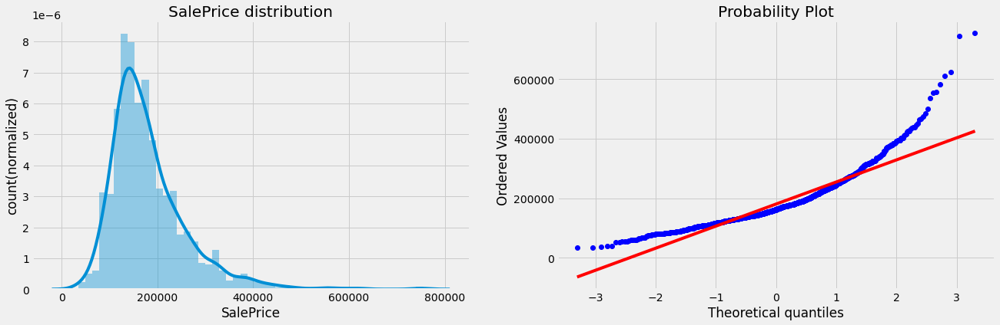

In [15]:
# Distribution
fig, ax= plt.subplots(1,2,figsize=(20,6))
sns.distplot(df["SalePrice"], ax=ax[0])
ax[0].set_xlabel("SalePrice")
ax[0].set_ylabel("count(normalized)")
ax[0].set_title("SalePrice distribution")

# Probability  plot
stats.probplot(df['SalePrice'], plot=ax[1])